In [ ]:
Проаналізуємо за допомогою методів кластерного аналізу товари

In [1]:
%matplotlib inline
from Visualization import give_data
from pandas.plotting import scatter_matrix
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import *
import numpy as np
import matplotlib.pyplot as plt
from Elasticity import elasticity_ols_models
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score
from sklearn import preprocessing
sns.set()

In [2]:
# виберемо параметри для кластеризації
data = give_data(['Source', 'Month', 'Brand', 'Model', 'ENERGY LABEL EU', 'NOFROST SYSTEM','NET LTRS.', 'Sales Units', 'PRICE USD/UN.'])

In [3]:
# редагування
data = data[data['Source'] == 'Traditional Sales']
data = data[(data['ENERGY LABEL EU'] != 'UNKNOWN') & (data['NET LTRS.'] != 'unknown') & (data['NOFROST SYSTEM'] != 'UNKNOWN')]
mas_for_energy = {'B':1, 'A':2, 'A+':3, 'A++':4, 'A+++':5}
mas_for_system = {'YES':1, 'NO':0}
data['ENERGY LABEL EU'] = data['ENERGY LABEL EU'].apply(lambda x: mas_for_energy[x])
data['NOFROST SYSTEM'] = data['NOFROST SYSTEM'].apply(lambda x: mas_for_system[x])
data['NET LTRS.'] = data['NET LTRS.'].apply(lambda x: int(x))

In [4]:
el = elasticity_ols_models(data, data['Model'].unique(), correct_length_of_sales=9)

In [5]:
data = data[data['Model'].isin(el['Model'].unique())]# додавання еластичності
data['Elasticity'] = pd.Series(np.random.randn(len(data['Model'])), index=data.index)
data['Elasticity'] = data.apply(lambda x: el[el['Model'] == x['Model']]['Elasticity'].values[0], axis=1)  

In [6]:
data.head()

,Source,Month,Brand,Model,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
0,Traditional Sales,2018-01-01,INDESIT,TIAA 14,3,0,245,581.000000,216.907888,-11.815988
1,Traditional Sales,2018-01-01,WHIRLPOOL,BSNF 9121 OX,3,1,349,526.000000,473.180393,-0.312873
2,Traditional Sales,2018-01-01,LG,GA-B429SECZ,4,1,302,521.400000,493.012902,2.804369
3,Traditional Sales,2018-01-01,SAMSUNG,RB37J5000SA/UA,3,1,367,515.000000,576.874039,-0.504816
4,Traditional Sales,2018-01-01,SAMSUNG,RB37J5000EF/UA,3,1,367,496.966038,575.123206,0.455472


In [7]:
data.describe()

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
count,7606.000000,7606.000000,7606.000000,7606.000000,7606.000000,7606.000000
mean,3.199842,0.491323,313.705627,43.923766,492.908609,-0.051803
std,0.557802,0.499958,101.222006,99.197894,297.546200,1.278280
min,1.000000,0.000000,0.000000,-3.000000,0.000000,-22.929611
25%,3.000000,0.000000,274.000000,4.000000,301.738163,-0.085357
50%,3.000000,0.000000,312.000000,11.784615,420.893950,-0.000462
75%,3.000000,1.000000,352.000000,38.000000,596.367438,0.089745
max,5.000000,1.000000,651.000000,1590.000000,2511.804930,5.517989


In [ ]:
d = data['Month'].unique()
data = data[data['Month'].isin([d[0]])] # можливо розглядати за неповний період

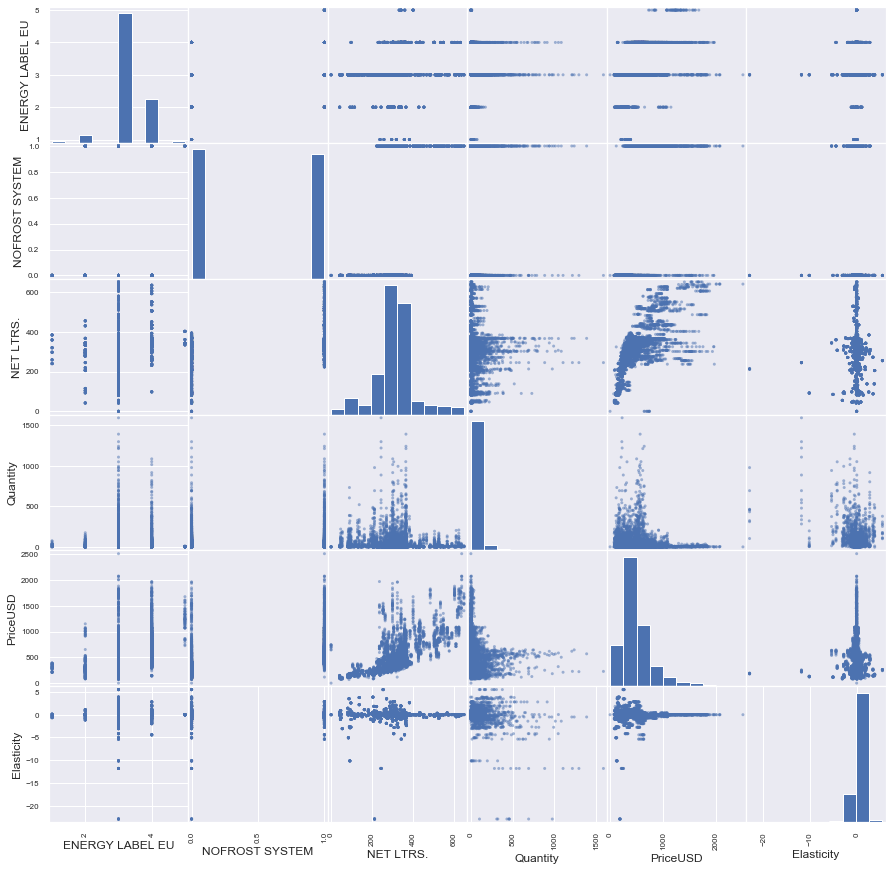

In [8]:
scatter_matrix(data,figsize=(15, 15)); # візуалізація даних

In [9]:
data.corr() # кореляційна матриця

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
ENERGY LABEL EU,1.000000,0.354662,0.207217,0.002633,0.433595,0.023041
NOFROST SYSTEM,0.354662,1.000000,0.503890,0.015083,0.558897,0.026547
NET LTRS.,0.207217,0.503890,1.000000,-0.043903,0.686601,0.029453
Quantity,0.002633,0.015083,-0.043903,1.000000,-0.095251,-0.263968
PriceUSD,0.433595,0.558897,0.686601,-0.095251,1.000000,0.022523
Elasticity,0.023041,0.026547,0.029453,-0.263968,0.022523,1.000000


In [10]:
data_for_clust=data.drop(data.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust # залишили лише потрібні стовпці

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
0,3,0,245,581.000000,216.907888,-11.815988
1,3,1,349,526.000000,473.180393,-0.312873
2,4,1,302,521.400000,493.012902,2.804369
3,3,1,367,515.000000,576.874039,-0.504816
4,3,1,367,496.966038,575.123206,0.455472
...,...,...,...,...,...,...
20933,4,0,337,-1.000000,379.752785,-0.010070
20941,3,1,321,-1.000000,461.350709,0.071051
20942,4,1,328,-1.000000,550.078825,0.558278
20944,4,1,346,-1.000000,585.605562,0.034153


In [11]:
digits_proj = TSNE(random_state=20150101).fit_transform(data_for_clust)# поглянемо на проекцію на площину

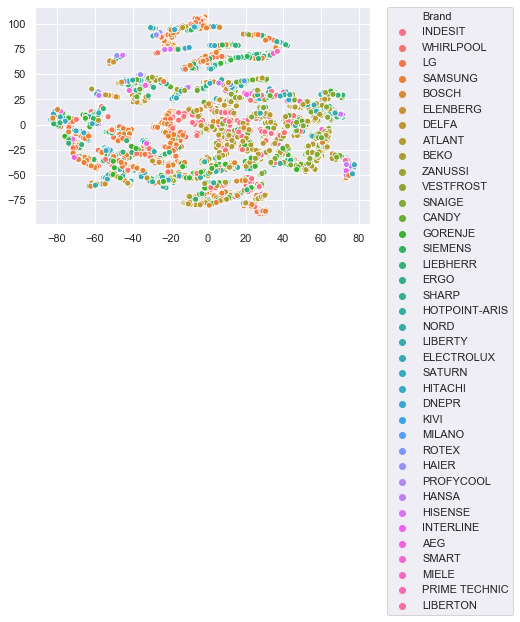

In [12]:
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=data['Brand'], legend='full')# по брендам
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [13]:
dataNorm = preprocessing.scale(data_for_clust) # перетворення даних до нормальних значень

In [14]:
digits_proj_norm = preprocessing.scale(digits_proj)

c:\users\zelen\desktop\python projects\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
c:\users\zelen\desktop\python projects\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [15]:
def clustering_criterion_kmeans(data, metric='euclidean'):# збірний критерій силует, калински-харабас и девіс-болдін
    print('Можлива к-ть класів')
    for i in range(2,20):
        m = KMeans(n_clusters=i).fit(data)
        c = silhouette_score(data, m.labels_, metric=metric)
        ch = calinski_harabasz_score(data, m.labels_)
        db = davies_bouldin_score(data, m.labels_)
        if(c>0):
            print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))
def clustering_criterion_ierarhi(data, method, metric):
    print('Можлива к-ть класів')
    for i in range(2,20):
        dist = pdist(data, metric)
        link = linkage(dist, method=method)
        cluster=fcluster(link, i, criterion='maxclust')
        c = silhouette_score(data, cluster, metric=metric, sample_size=6000)
        ch = calinski_harabasz_score(data, cluster)
        db = davies_bouldin_score(data, cluster)
        if(c>0):
            print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))

In [16]:
clustering_criterion_kmeans(dataNorm)

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.35982944817284446
calinski harabasz score: 3124.058705774023
davies_bouldin_score: 1.216703411371349
Clusters: 3
silhouette_score: 0.3740217124555935
calinski harabasz score: 2654.1712581581874
davies_bouldin_score: 1.088468204619546
Clusters: 4
silhouette_score: 0.3537562521285217
calinski harabasz score: 2534.8434796651813
davies_bouldin_score: 1.1577414109416004
Clusters: 5
silhouette_score: 0.3472838136656884
calinski harabasz score: 2445.2656518957688
davies_bouldin_score: 1.0038464487141783
Clusters: 6
silhouette_score: 0.3772085860878622
calinski harabasz score: 2565.310877682291
davies_bouldin_score: 0.9046469573025604
Clusters: 7
silhouette_score: 0.3710497427834701
calinski harabasz score: 2586.798295548288
davies_bouldin_score: 1.0130689527500638
Clusters: 8
silhouette_score: 0.39475292456300487
calinski harabasz score: 2556.9255167825477
davies_bouldin_score: 0.9543346863304709
Clusters: 9
silhouette_score: 0.3975356804350

In [17]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=2).fit(dataNorm)

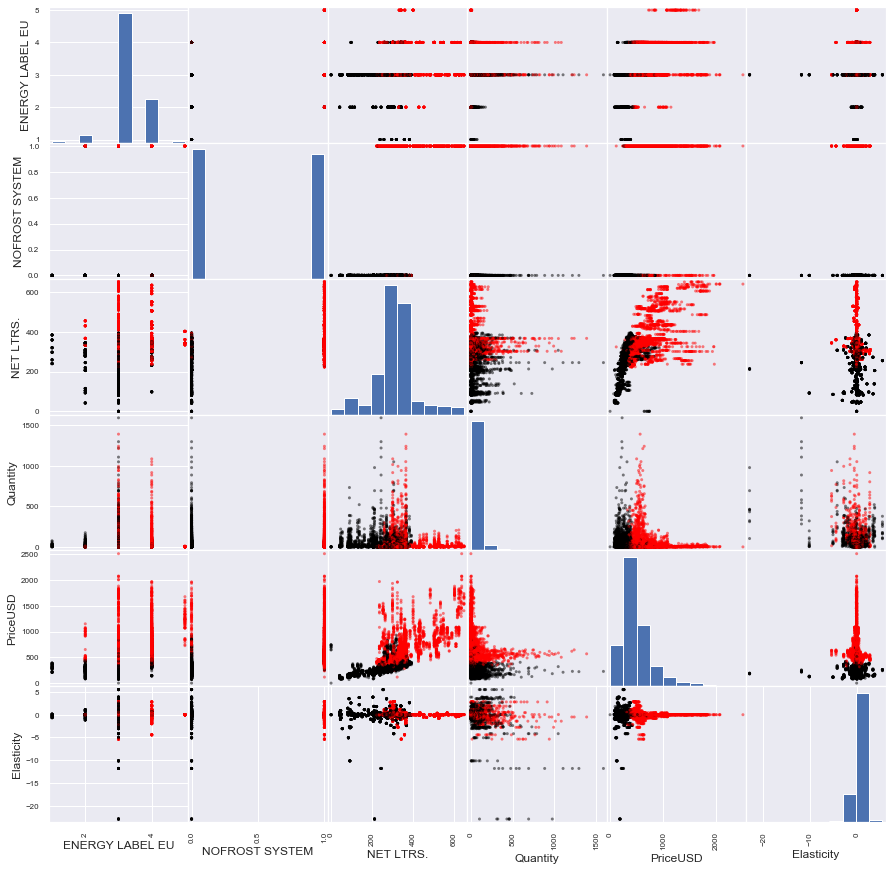

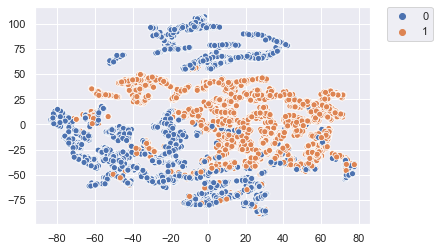

In [18]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [19]:
data['cluster_kmean_nd_2']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3856.000000     3856.000000  3856.000000  3856.000000  3856.000000   
mean          3.427645        0.964212   364.779824    44.176491   676.858538   
std           0.555555        0.185786    89.080238   108.325683   303.721075   
min           2.000000        0.000000   224.000000    -1.000000   116.905072   
25%           3.000000        1.000000   307.000000     3.875000   469.697227   
50%           3.000000        1.000000   339.000000     9.500000   579.238931   
75%           4.000000        1.000000   367.000000    32.000000   780.725811   
max           5.000000        1.000000   651.000000  1388.679739  2511.804930   

        Elasticity  
count  3856.000000  
mean     -0.017126  
std       0.621786  
min      -5.370740  
25%      -0.052266  
50%      -0.001531  
75%       0.045987  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

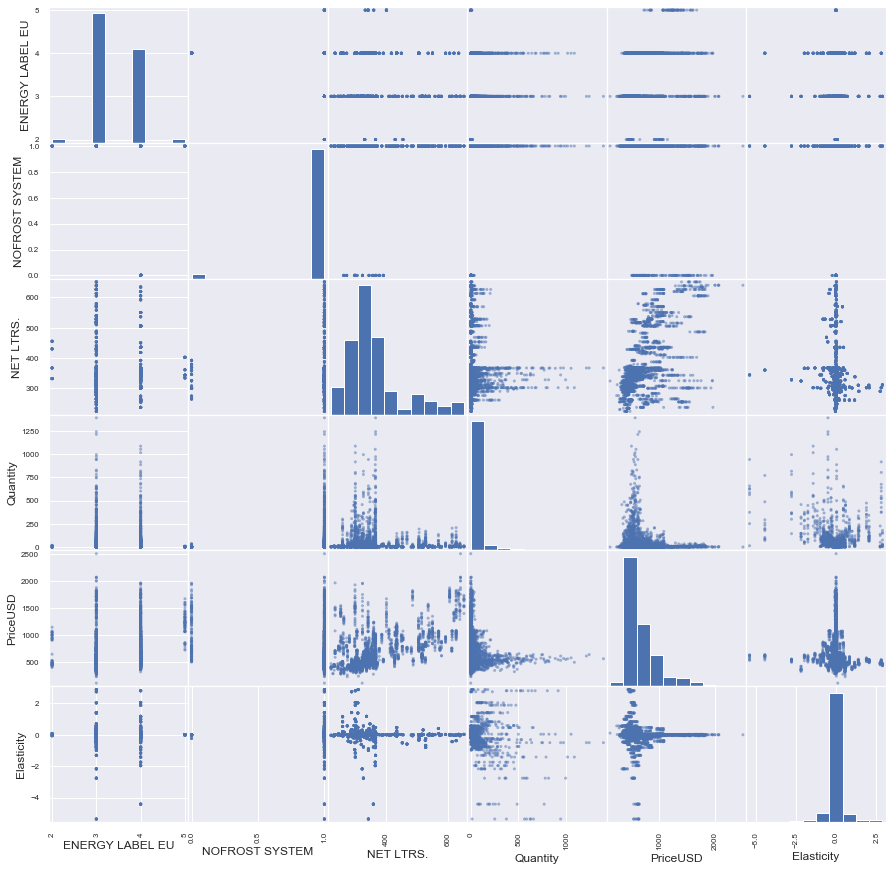

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3750.000000     3750.000000  3750.000000  3750.000000  3750.000000   
mean          2.965600        0.005067   261.187733    43.663897   303.759029   
std           0.453363        0.071009    84.750659    88.853386   118.950371   
min           1.000000        0.000000     0.000000    -3.000000     0.000000   
25%           3.000000        0.000000   213.000000     5.000000   228.390432   
50%           3.000000        0.000000   285.000000    13.400000   301.254002   
75%           3.000000        0.000000   321.000000    45.985160   356.007506   
max           4.000000        1.000000   393.000000  1590.000000   930.692078   

        Elasticity  
count  3750.000000  
mean     -0.087460  
std       1.707214  
min     -22.929611  
25%      -0.137743  
50%       0.006180  
75%       0.168223  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

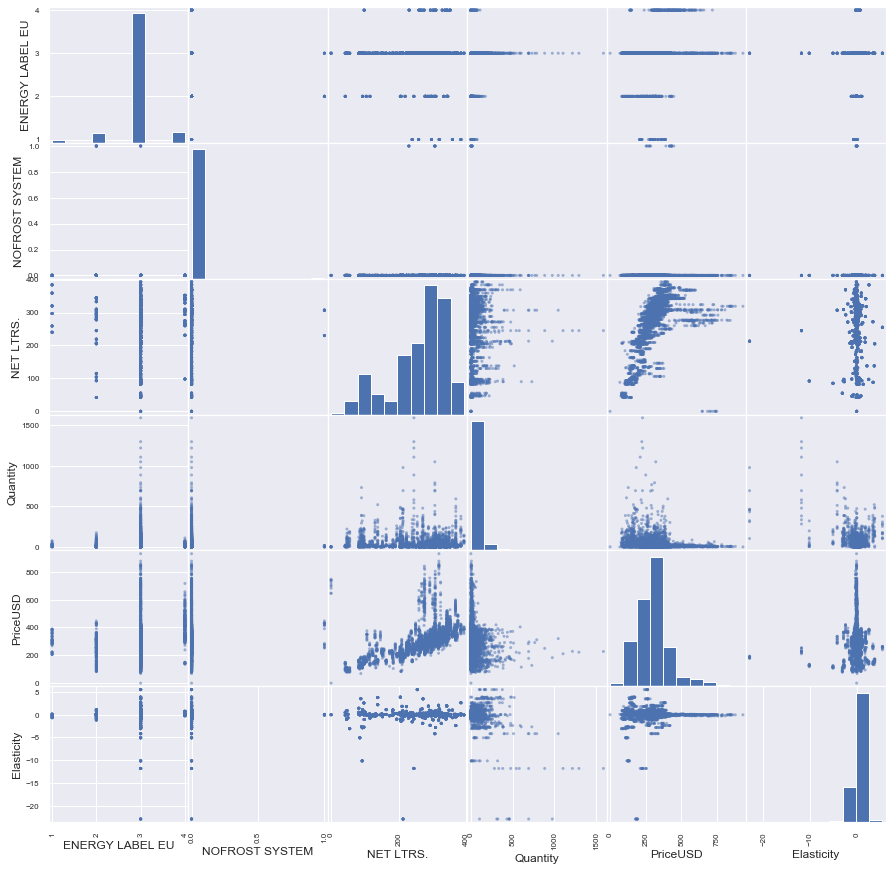

In [20]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [21]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=15).fit(dataNorm)

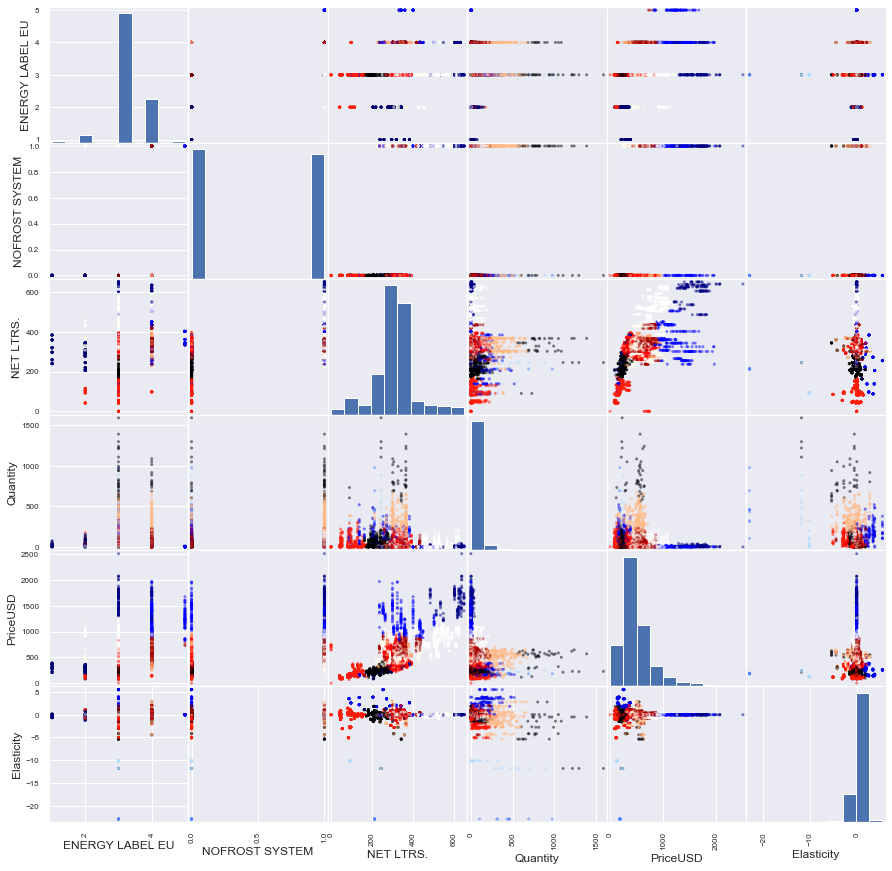

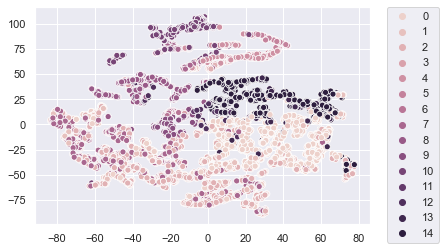

In [22]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [23]:
data['cluster_kmean_nd_15']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count           1519.0          1519.0  1519.000000  1519.000000  1519.000000   
mean               3.0             0.0   321.490454    27.528445   377.350453   
std                0.0             0.0    27.439568    36.852269   106.780965   
min                3.0             0.0   260.000000     1.000000   214.862306   
25%                3.0             0.0   302.000000     5.000000   317.557934   
50%                3.0             0.0   321.000000    12.000000   347.715756   
75%                3.0             0.0   339.000000    34.000000   388.565620   
max                3.0             0.0   393.000000   229.000000   930.692078   

        Elasticity  
count  1519.000000  
mean     -0.044388  
std       0.518408  
min      -2.814364  
25%      -0.137859  
50%      -0.001800  
75%       0.079090  
max       1.952064  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 3.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 3.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 3.0 results in singular transformations; automatically expanding.
  ax.set_xlim(

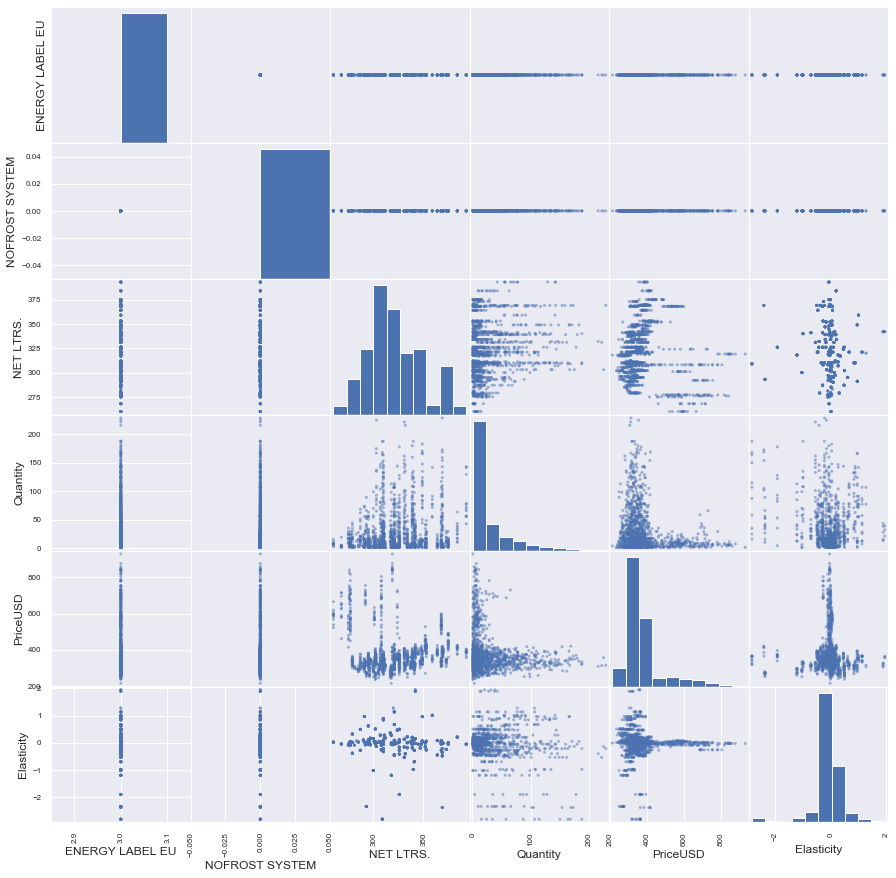

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            319.0           319.0  319.000000  319.000000  319.000000   
mean               4.0             0.0  322.025078   12.865324  483.990805   
std                0.0             0.0   39.837950   16.183605  157.482879   
min                4.0             0.0  231.000000   -1.000000  239.013902   
25%                4.0             0.0  294.000000    3.000000  352.949137   
50%                4.0             0.0  337.000000    6.300000  443.797114   
75%                4.0             0.0  346.000000   15.000000  566.393565   
max                4.0             0.0  392.000000  110.500000  960.229339   

       Elasticity  
count  319.000000  
mean     0.022932  
std      0.157286  
min     -0.238619  
25%     -0.025225  
50%     -0.002624  
75%      0.033686  
max      0.706790  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 4.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:95: RuntimeWarning: invalid value encountered in true_divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


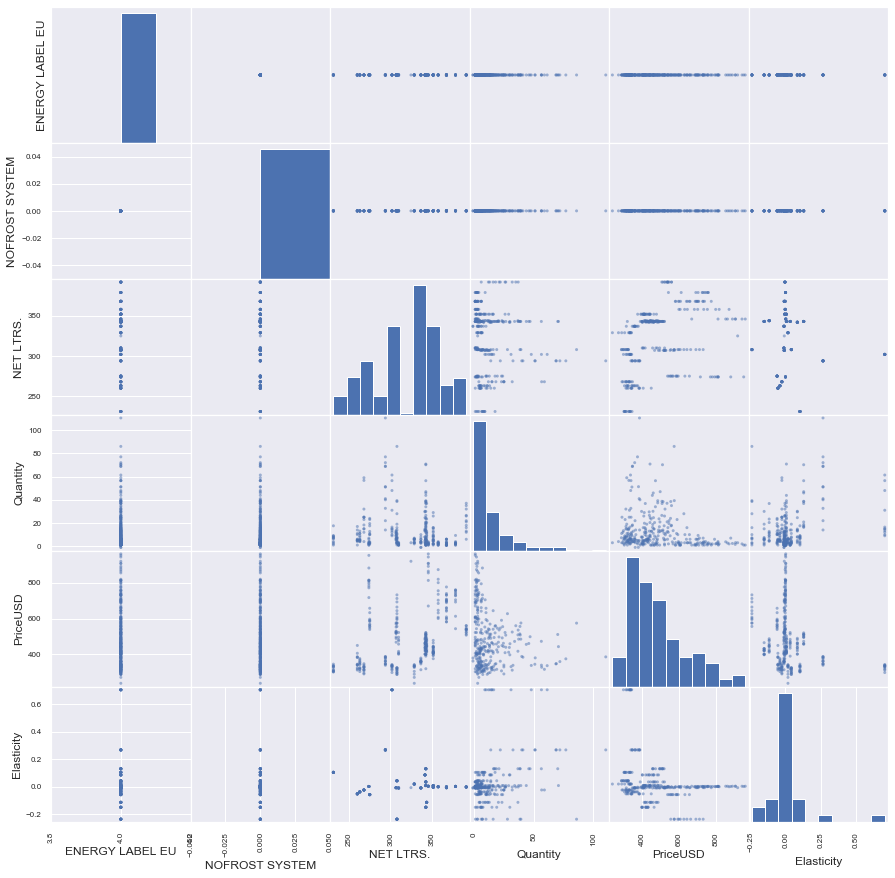

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count       1622.00000          1622.0  1622.000000  1622.000000  1622.000000   
mean           2.97164             1.0   319.597411    22.003606   496.110781   
std            0.16605             0.0    36.454632    35.374524   113.217634   
min            2.00000             1.0   224.000000    -1.000000   116.905072   
25%            3.00000             1.0   300.750000     4.000000   424.711892   
50%            3.00000             1.0   319.000000     8.500000   471.702312   
75%            3.00000             1.0   339.000000    22.000000   549.704008   
max            3.00000             1.0   455.000000   218.600000  1050.821296   

        Elasticity  
count  1622.000000  
mean      0.040611  
std       0.470478  
min      -5.370740  
25%      -0.054352  
50%       0.004702  
75%       0.080826  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 1.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


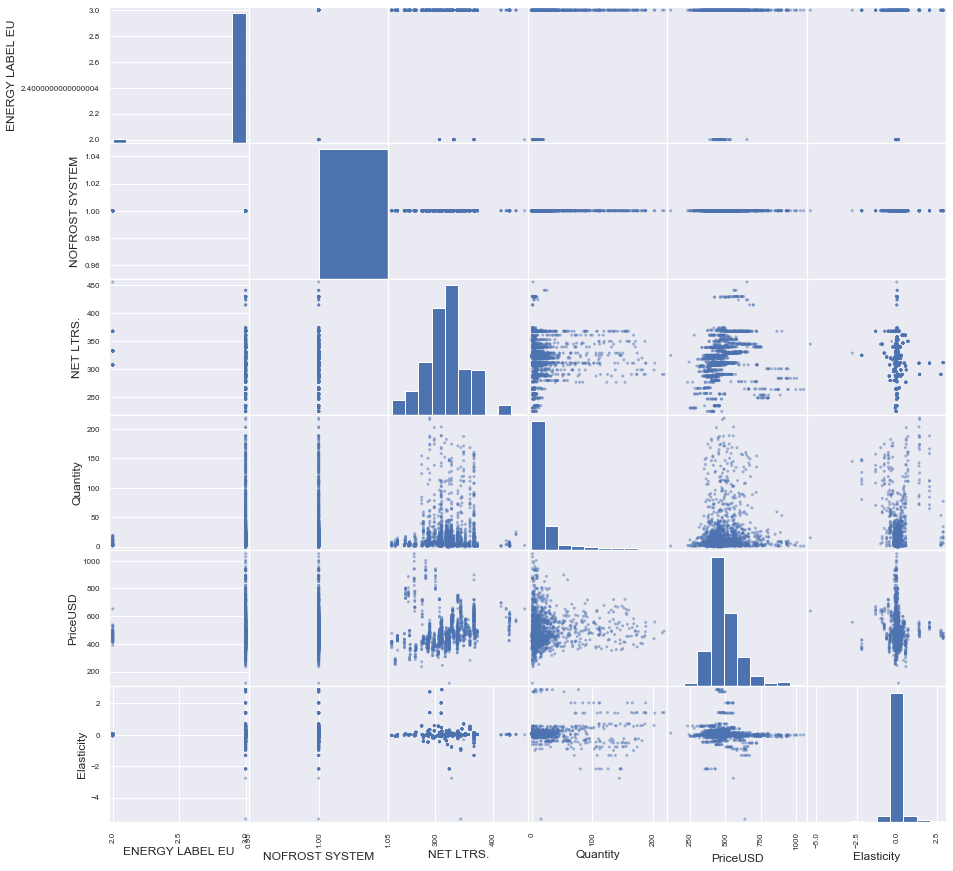

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count             20.0            20.0   20.000000   20.000000   20.000000   
mean               3.0             0.0  153.200000  255.006350  170.688923   
std                0.0             0.0   76.901578  265.182363   55.122318   
min                3.0             0.0   92.000000    4.000000  117.240770   
25%                3.0             0.0   92.000000   29.687893  125.660372   
50%                3.0             0.0   92.000000  155.135344  133.604524   
75%                3.0             0.0  245.000000  406.000000  228.088971   
max                3.0             0.0  245.000000  885.500000  255.354381   

       Elasticity  
count   20.000000  
mean   -10.814720  
std      0.838770  
min    -11.815988  
25%    -11.815988  
50%    -10.147207  
75%    -10.147207  
max    -10.147207  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

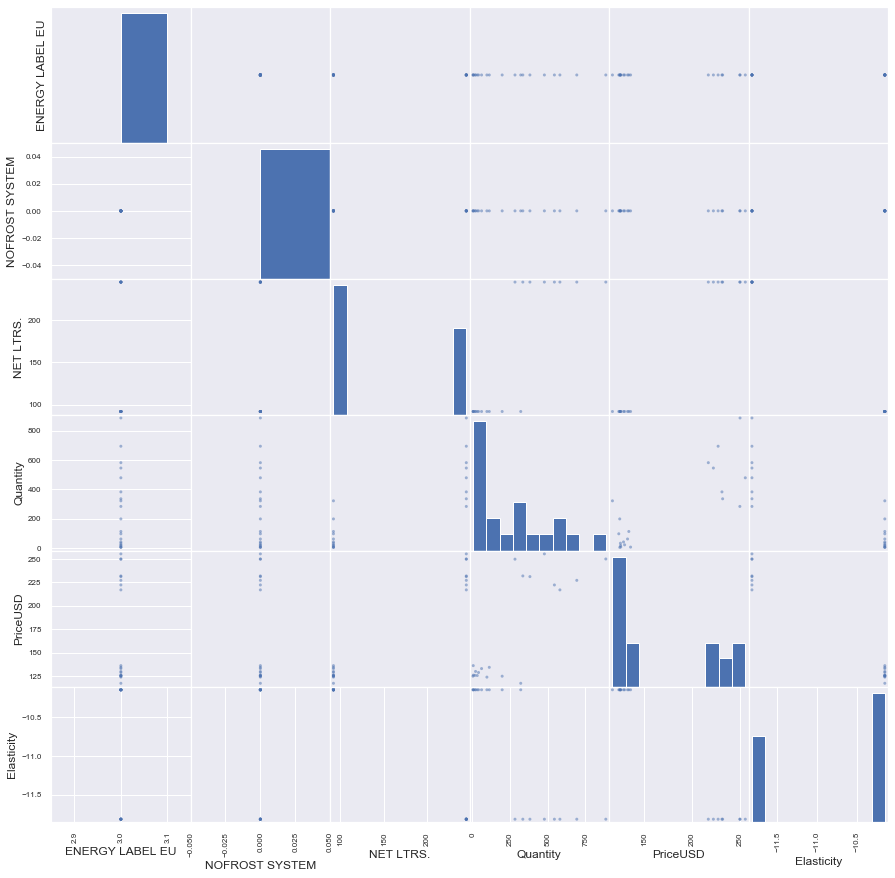

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       333.000000      333.000000  333.000000  333.000000   333.000000   
mean          4.192192        0.813814  356.639640    5.029589  1184.580468   
std           0.394616        0.389843   66.341458    5.120767   234.623188   
min           4.000000        0.000000  237.000000    1.000000   834.238160   
25%           4.000000        1.000000  307.000000    2.000000   996.506007   
50%           4.000000        1.000000  360.000000    3.651685  1116.611204   
75%           4.000000        1.000000  418.000000    5.800000  1350.304118   
max           5.000000        1.000000  505.000000   39.000000  1971.058245   

       Elasticity  
count  333.000000  
mean    -0.008658  
std      0.022177  
min     -0.092559  
25%     -0.014859  
50%     -0.002218  
75%      0.002188  
max      0.041490  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

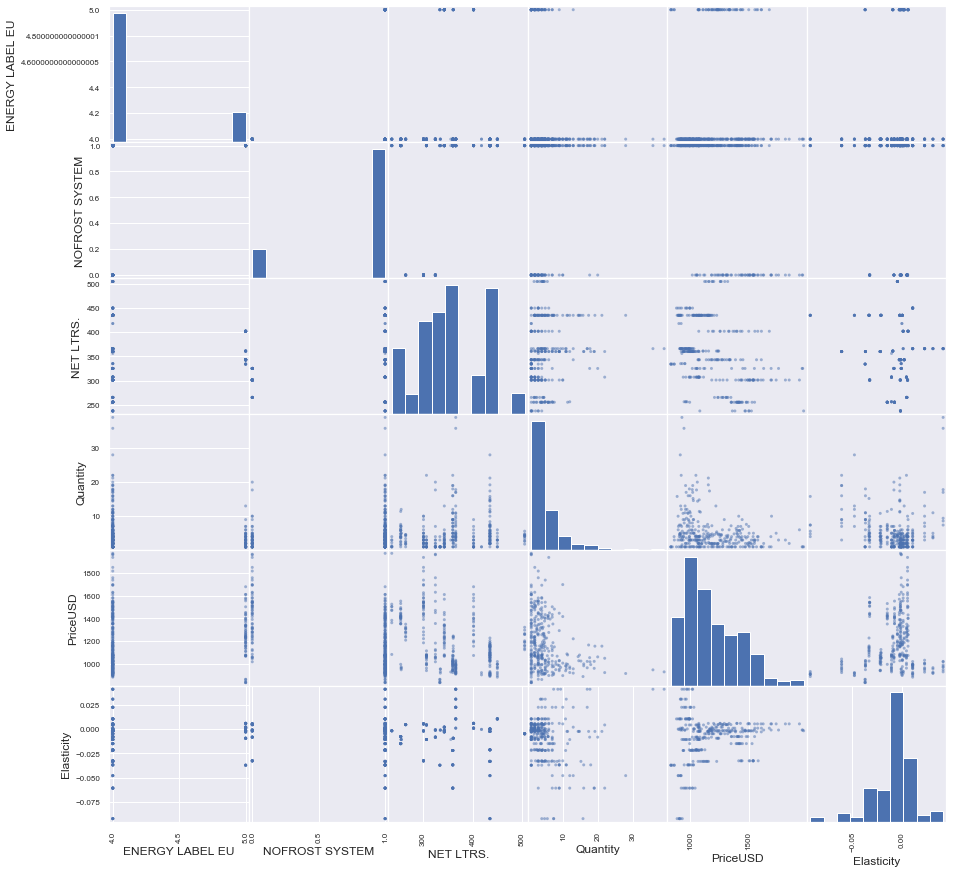

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       137.000000           137.0  137.000000  137.000000   137.000000   
mean          3.306569             1.0  600.459854    9.621983  1604.710409   
std           0.462761             0.0   50.547301    9.590997   216.075158   
min           3.000000             1.0  486.000000    1.000000  1208.591368   
25%           3.000000             1.0  605.000000    3.000000  1429.187050   
50%           3.000000             1.0  626.000000    6.000000  1646.939586   
75%           4.000000             1.0  634.000000   13.000000  1756.784367   
max           4.000000             1.0  651.000000   45.000000  2511.804930   

       Elasticity  
count  137.000000  
mean    -0.016429  
std      0.027939  
min     -0.062638  
25%     -0.037067  
50%     -0.007408  
75%      0.000227  
max      0.022406  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

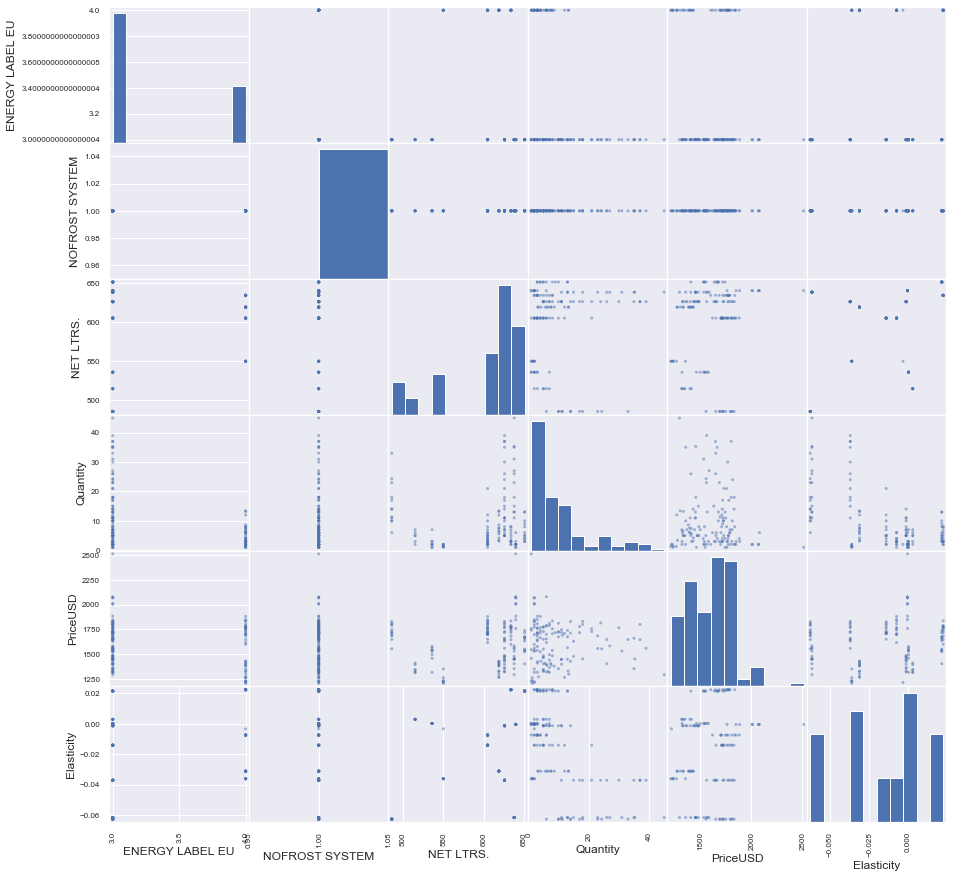

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count        40.000000       40.000000   40.000000    40.000000   40.000000   
mean          3.300000        0.725000  317.025000   887.612001  479.870291   
std           0.464095        0.452203   64.893399   237.269407  158.006745   
min           3.000000        0.000000   90.000000   562.800000  115.165367   
25%           3.000000        0.000000  302.000000   733.250000  318.010345   
50%           3.000000        1.000000  336.000000   808.531364  548.213178   
75%           4.000000        1.000000  366.000000  1022.500000  580.563494   
max           4.000000        1.000000  367.000000  1590.000000  645.429020   

       Elasticity  
count   40.000000  
mean    -3.058989  
std      3.675464  
min    -11.815988  
25%     -4.659595  
50%     -2.670198  
75%     -0.504816  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

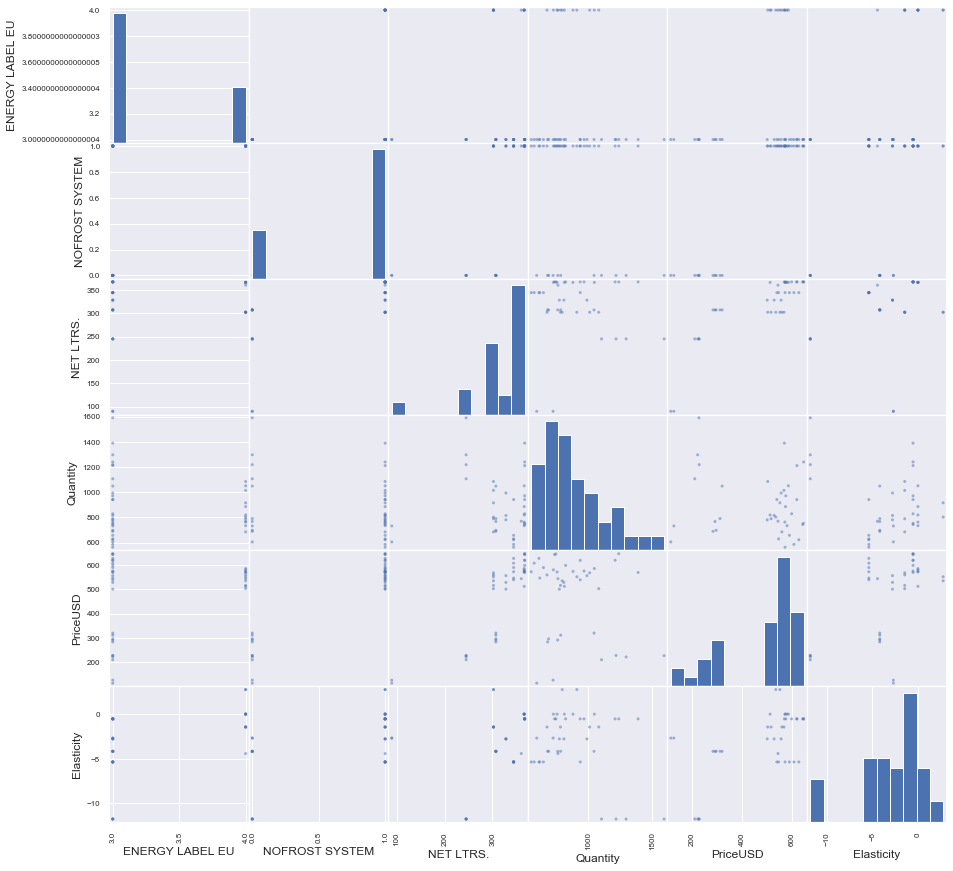

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1003.000000          1003.0  1003.000000  1003.000000  1003.000000   
mean          4.002991             1.0   337.995015    32.675528   603.285993   
std           0.054636             0.0    39.652973    41.790094   123.510354   
min           4.000000             1.0   237.000000    -1.000000   326.271099   
25%           4.000000             1.0   304.000000     6.000000   503.632992   
50%           4.000000             1.0   341.000000    16.600000   596.874065   
75%           4.000000             1.0   360.000000    44.000000   675.881467   
max           5.000000             1.0   435.000000   229.848460   918.790719   

        Elasticity  
count  1003.000000  
mean      0.045923  
std       0.537913  
min      -4.422547  
25%      -0.048644  
50%       0.010796  
75%       0.114040  
max       2.056106  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

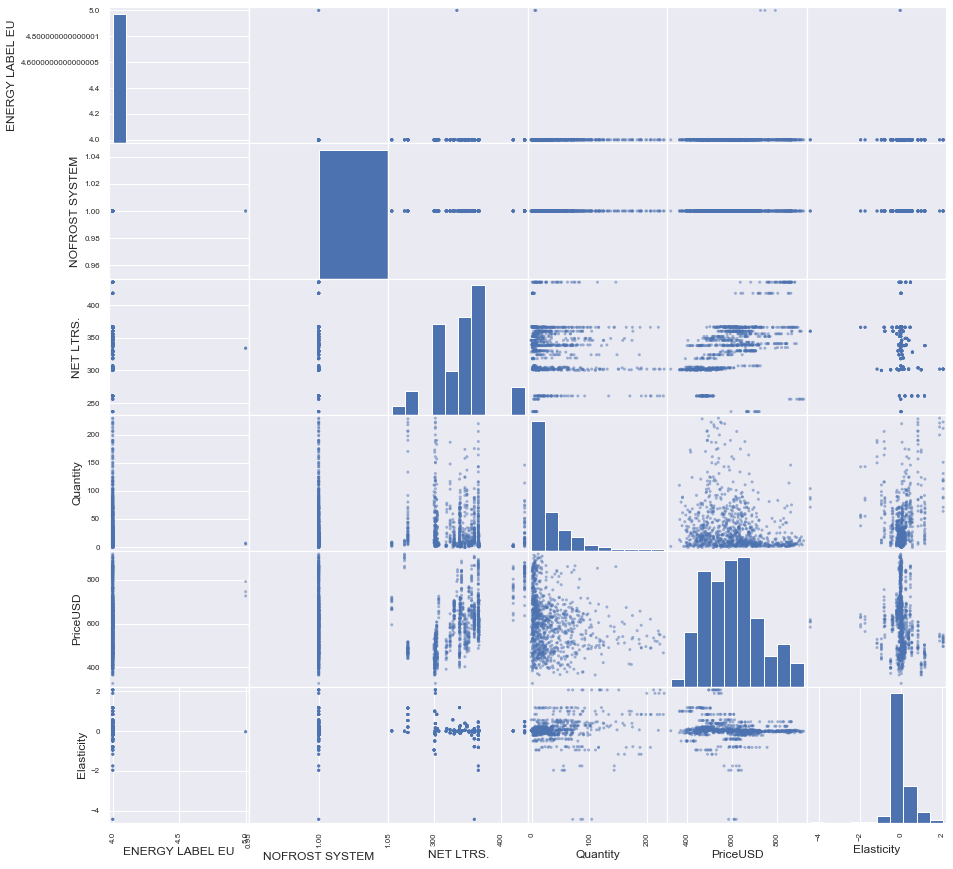

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       519.000000           519.0  519.000000  519.000000  519.000000   
mean          2.938343             0.0   96.739884   34.222455  176.478250   
std           0.316920             0.0   36.052993   53.449509   98.808570   
min           2.000000             0.0    0.000000   -1.000000    0.000000   
25%           3.000000             0.0   82.000000    4.000000  118.834223   
50%           3.000000             0.0   97.000000   11.000000  152.764167   
75%           3.000000             0.0  123.000000   38.000000  199.404791   
max           4.000000             0.0  173.000000  299.000000  746.947794   

       Elasticity  
count  519.000000  
mean    -0.301554  
std      1.190558  
min     -5.071539  
25%     -0.374923  
50%      0.000151  
75%      0.209487  
max      1.408134  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

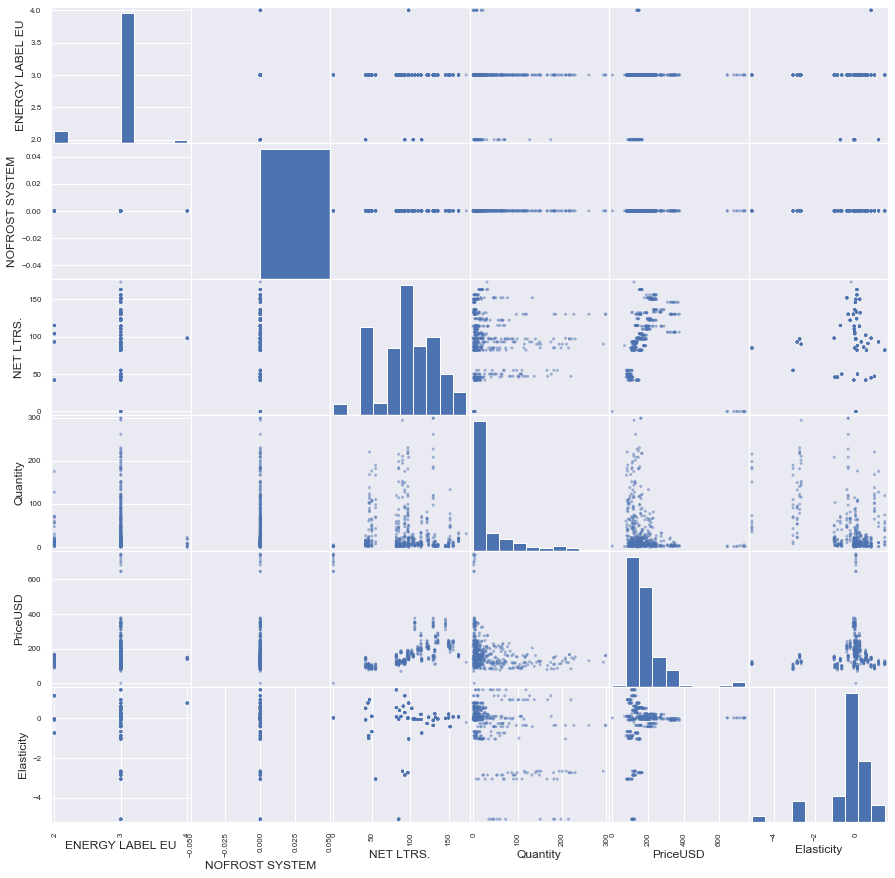

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       209.000000      209.000000  209.000000  209.000000  209.000000   
mean          3.330144        0.779904  324.148325  354.493192  488.515040   
std           0.471394        0.415306   49.667374  112.747963  130.334919   
min           3.000000        0.000000   90.000000  177.300000  107.239559   
25%           3.000000        1.000000  302.000000  262.000000  409.204718   
50%           3.000000        1.000000  328.000000  333.000000  526.251266   
75%           4.000000        1.000000  366.000000  414.000000  578.182725   
max           4.000000        1.000000  369.000000  674.547395  709.108571   

       Elasticity  
count  209.000000  
mean    -0.813825  
std      1.712622  
min     -5.370740  
25%     -1.906452  
50%     -0.748785  
75%      0.033115  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

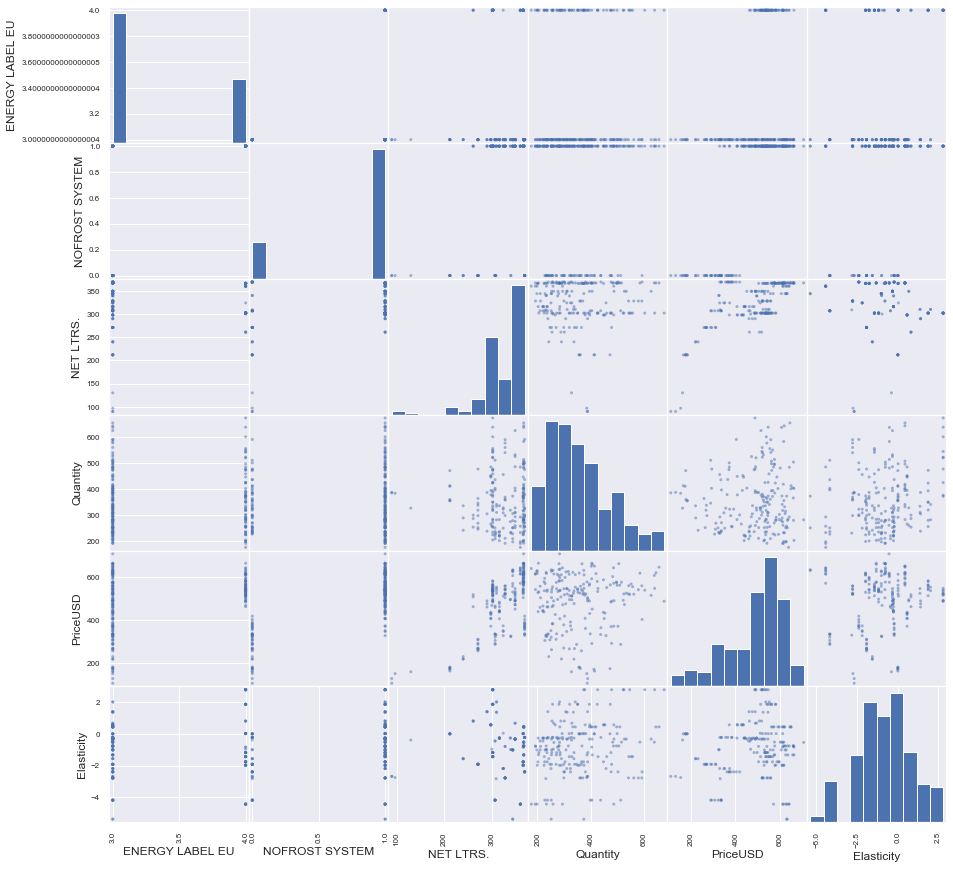

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       506.000000           506.0  506.000000  506.000000   506.000000   
mean          3.160079             1.0  514.092885   28.347493   851.280299   
std           0.471008             0.0   60.196915   38.360000   165.815296   
min           2.000000             1.0  367.000000   -1.000000   448.489447   
25%           3.000000             1.0  488.000000    3.000000   738.951044   
50%           3.000000             1.0  517.000000   10.000000   848.016465   
75%           3.000000             1.0  550.000000   37.945755   988.625549   
max           4.000000             1.0  626.000000  209.000000  1264.908015   

       Elasticity  
count  506.000000  
mean    -0.102432  
std      0.237419  
min     -0.809636  
25%     -0.227900  
50%     -0.013678  
75%      0.011951  
max      0.396754  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

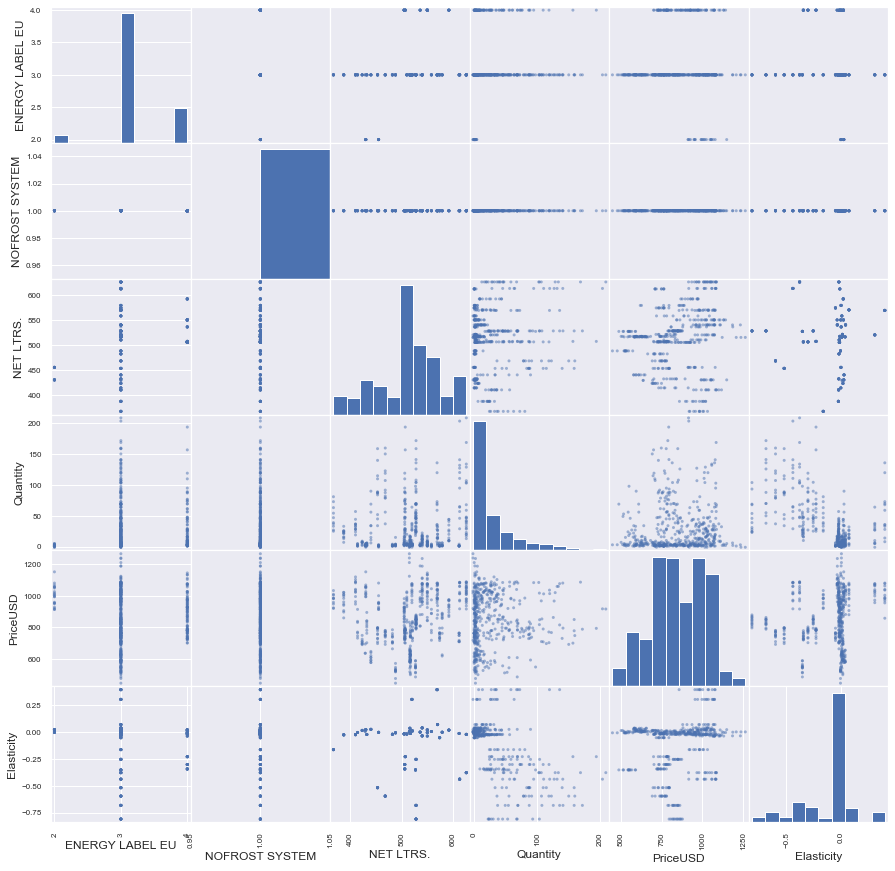

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count              9.0             9.0        9.0    9.000000    9.000000   
mean               3.0             0.0      213.0  469.000000  186.047872   
std                0.0             0.0        0.0  247.244818    5.413783   
min                3.0             0.0      213.0  104.000000  178.051725   
25%                3.0             0.0      213.0  324.000000  183.187402   
50%                3.0             0.0      213.0  457.000000  187.211267   
75%                3.0             0.0      213.0  464.000000  188.549703   
max                3.0             0.0      213.0  977.000000  193.524693   

       Elasticity  
count    9.000000  
mean   -22.929611  
std      0.000000  
min    -22.929611  
25%    -22.929611  
50%    -22.929611  
75%    -22.929611  
max    -22.929611  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN          

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 213.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == -22.92961147245021 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 213.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 213.0 results in singular transformations; automatically expa

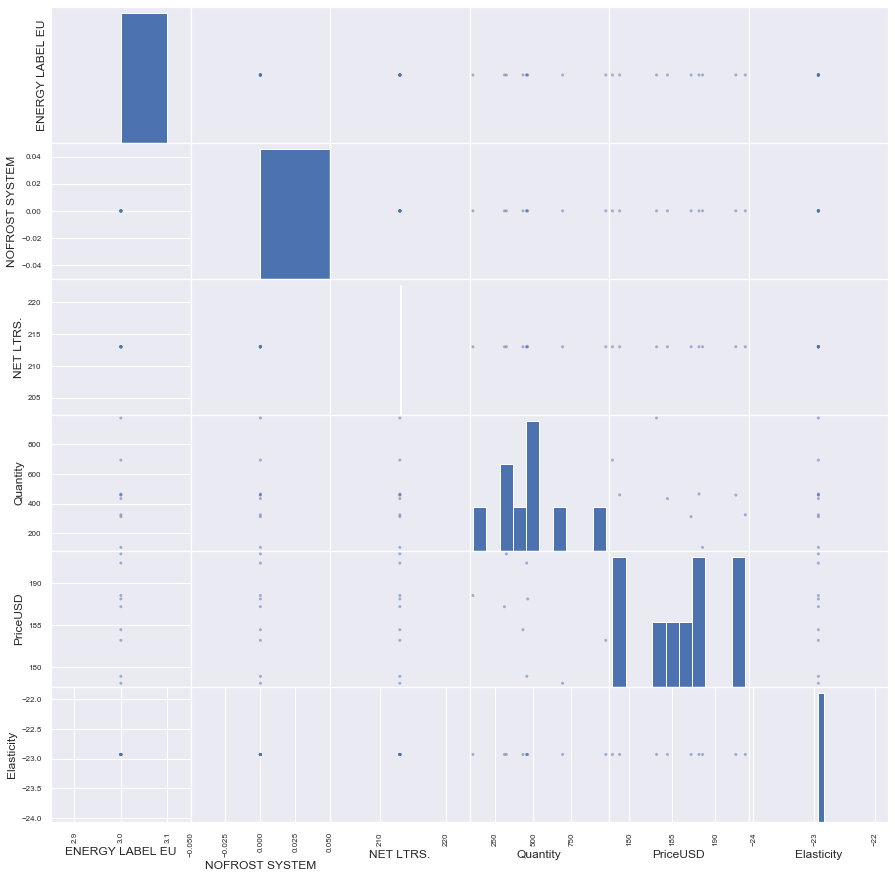

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            197.0      197.000000  197.000000  197.000000  197.000000   
mean               3.0        0.030457  242.451777  154.101662  252.502272   
std                0.0        0.172279   89.609777   98.874747   90.123863   
min                3.0        0.000000   88.000000   -3.000000  131.662628   
25%                3.0        0.000000  163.000000   78.000000  162.958086   
50%                3.0        0.000000  255.000000  139.300000  258.671725   
75%                3.0        0.000000  318.000000  206.744545  311.824911   
max                3.0        1.000000  384.000000  520.760000  493.234569   

       Elasticity  
count  197.000000  
mean     2.510486  
std      1.209702  
min      0.018706  
25%      1.825471  
50%      2.200602  
75%      3.485004  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN 

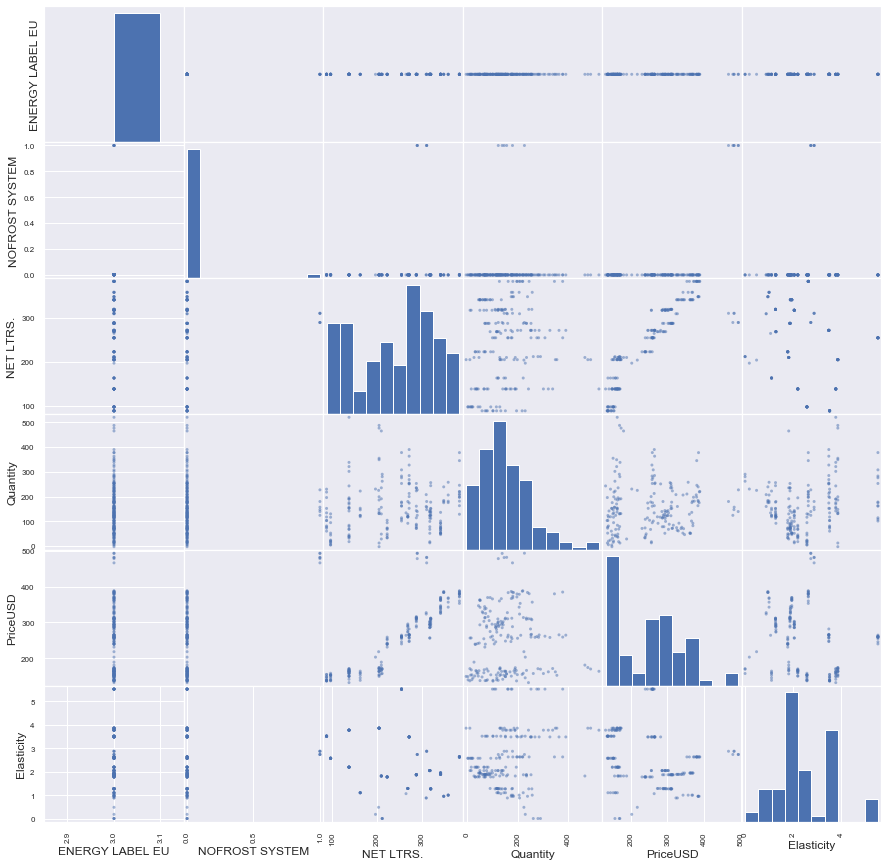

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       259.000000           259.0  259.000000  259.000000  259.000000   
mean          1.733591             0.0  294.061776   23.352487  279.890818   
std           0.442937             0.0   46.559914   27.274933   57.212799   
min           1.000000             0.0  205.000000    1.000000   82.240372   
25%           1.000000             0.0  278.000000    4.437500  236.610096   
50%           2.000000             0.0  296.000000   13.333333  287.388271   
75%           2.000000             0.0  333.000000   30.250000  316.986389   
max           2.000000             0.0  384.000000  153.000000  388.210305   

       Elasticity  
count  259.000000  
mean    -0.108787  
std      0.376901  
min     -1.138110  
25%     -0.263523  
50%     -0.035574  
75%      0.106068  
max      0.842468  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

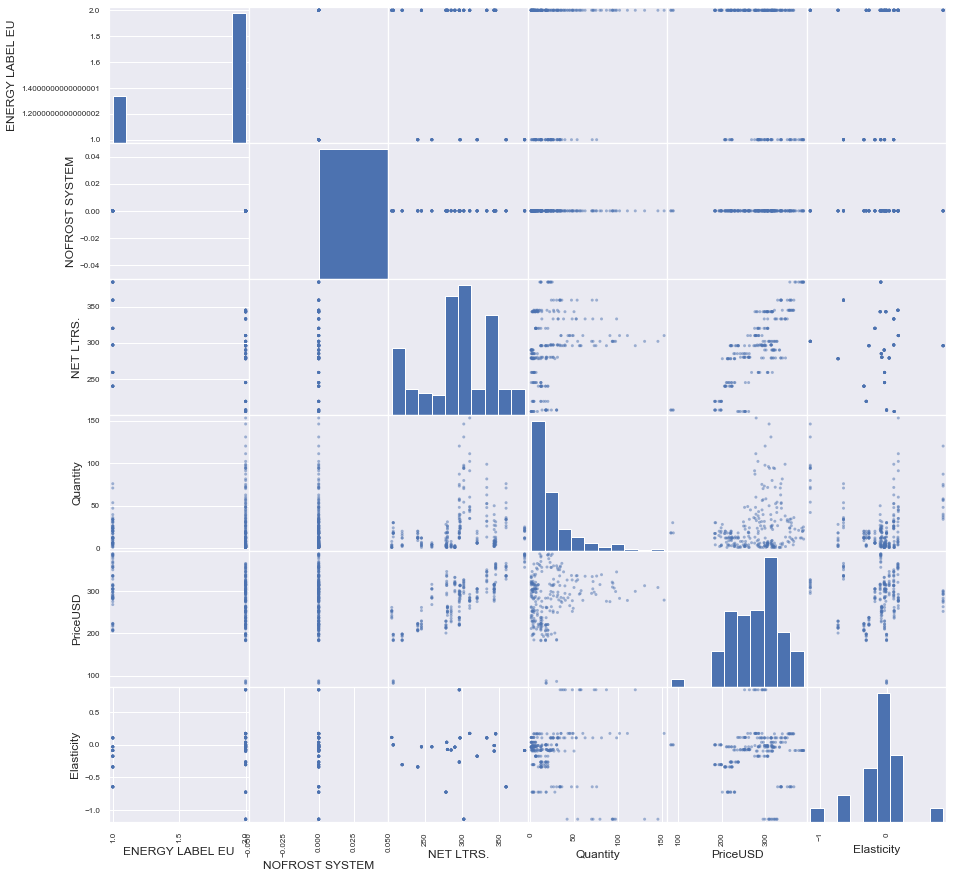

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            914.0           914.0  914.000000  914.000000  914.000000   
mean               3.0             0.0  237.288840   32.036823  247.723128   
std                0.0             0.0   30.503079   42.602826   50.161290   
min                3.0             0.0  163.000000   -2.000000   94.444739   
25%                3.0             0.0  212.000000    4.000000  212.528418   
50%                3.0             0.0  240.000000   12.366667  246.850664   
75%                3.0             0.0  265.000000   44.318952  277.251969   
max                3.0             0.0  295.000000  260.000000  433.450479   

       Elasticity  
count  914.000000  
mean     0.017894  
std      0.529966  
min     -1.906452  
25%     -0.137743  
50%      0.030081  
75%      0.218018  
max      1.825471  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN 

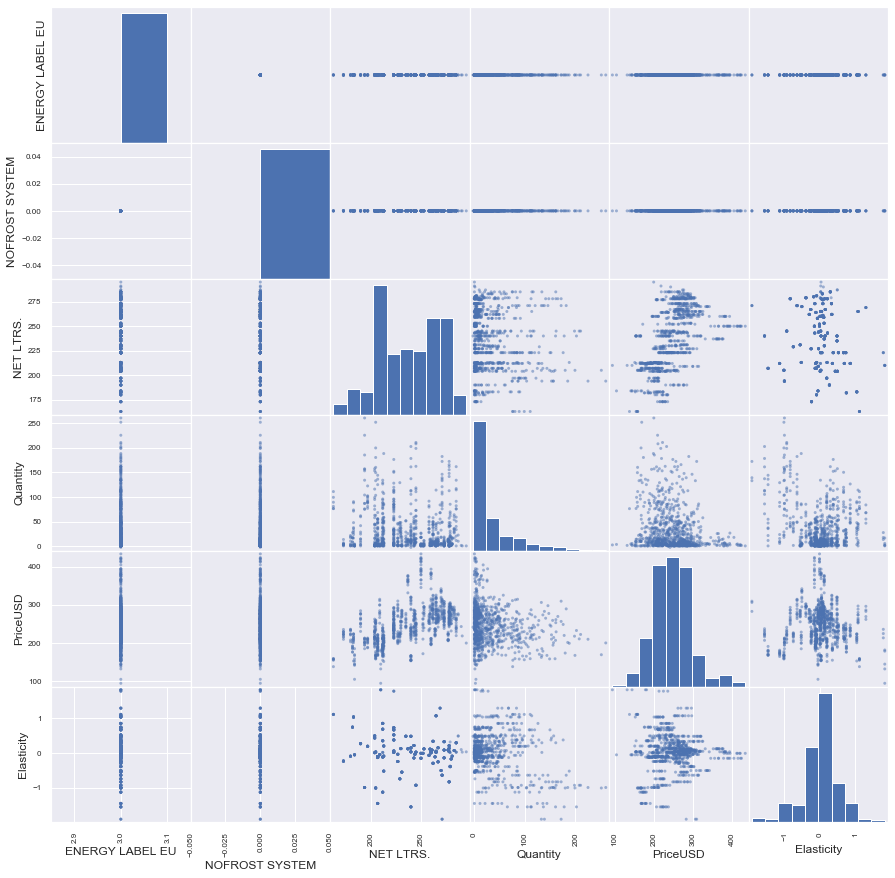

In [24]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Побудуємо кластеризацію на отриманих даних T-SNE

In [26]:
clustering_criterion_kmeans(digits_proj_norm)

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.35066742
calinski harabasz score: 4504.749934711593
davies_bouldin_score: 1.171955713043461
Clusters: 3
silhouette_score: 0.4150277
calinski harabasz score: 6869.414355447545
davies_bouldin_score: 0.7986165835821168
Clusters: 4
silhouette_score: 0.4002723
calinski harabasz score: 7263.990427636897
davies_bouldin_score: 0.7785341502980524
Clusters: 5
silhouette_score: 0.4009337
calinski harabasz score: 7218.125645436785
davies_bouldin_score: 0.8777709887916945
Clusters: 6
silhouette_score: 0.40019777
calinski harabasz score: 7381.558818410688
davies_bouldin_score: 0.8259556889487469
Clusters: 7
silhouette_score: 0.39169705
calinski harabasz score: 7451.8214416077435
davies_bouldin_score: 0.8280314734815485
Clusters: 8
silhouette_score: 0.3924065
calinski harabasz score: 7669.438498368767
davies_bouldin_score: 0.7979391659977827
Clusters: 9
silhouette_score: 0.4045294
calinski harabasz score: 7992.2571067574545
davies_bouldin_score: 0.7

In [27]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=15).fit(digits_proj_norm)

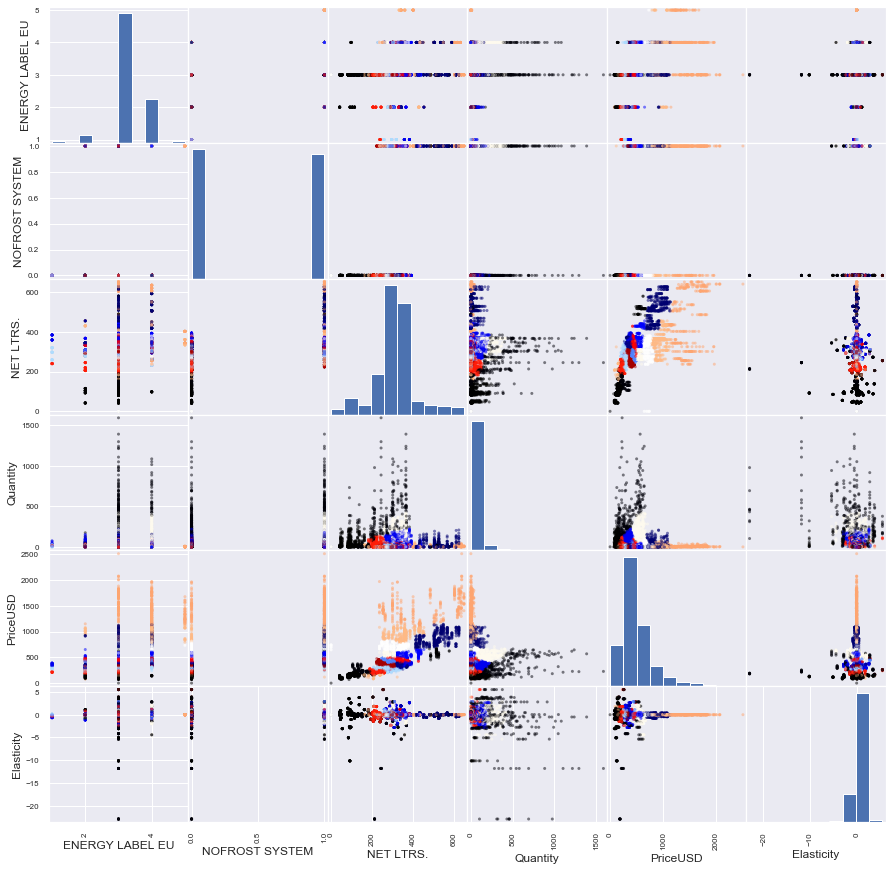

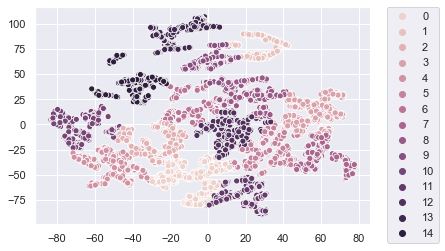

In [28]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [29]:
data['cluster_kmean_t_sne']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       617.000000      617.000000  617.000000  617.000000  617.000000   
mean          3.225284        0.730956  332.904376   14.466508  454.763620   
std           0.502729        0.443823   21.216240   16.432390   25.271916   
min           2.000000        0.000000  277.000000   -1.000000  401.786235   
25%           3.000000        0.000000  319.000000    3.000000  435.674997   
50%           3.000000        1.000000  338.000000    8.460000  459.091761   
75%           4.000000        1.000000  348.000000   19.000000  474.689039   
max           4.000000        1.000000  428.000000   96.000000  503.776256   

       Elasticity  
count  617.000000  
mean     0.055998  
std      0.368853  
min     -0.952429  
25%     -0.031780  
50%      0.006976  
75%      0.084759  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

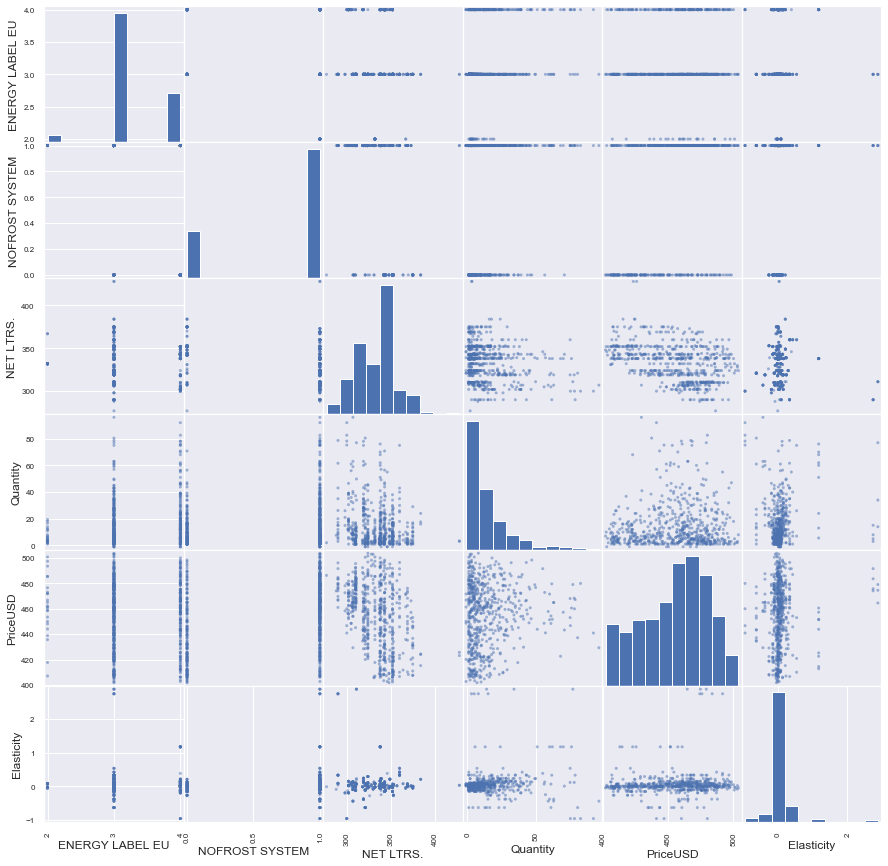

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       312.000000      312.000000  312.000000  312.000000   312.000000   
mean          3.820513        0.826923  459.256410    6.301394  1469.235550   
std           0.680336        0.378921  142.971941    7.522488   233.229221   
min           2.000000        0.000000  237.000000   -1.000000  1095.897479   
25%           3.000000        1.000000  325.000000    2.000000  1275.984225   
50%           4.000000        1.000000  435.000000    4.000000  1436.069393   
75%           4.000000        1.000000  619.000000    7.000000  1648.461685   
max           5.000000        1.000000  651.000000   45.000000  2511.804930   

       Elasticity  
count  312.000000  
mean    -0.010477  
std      0.021249  
min     -0.062638  
25%     -0.021265  
50%     -0.002218  
75%      0.001160  
max      0.023892  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

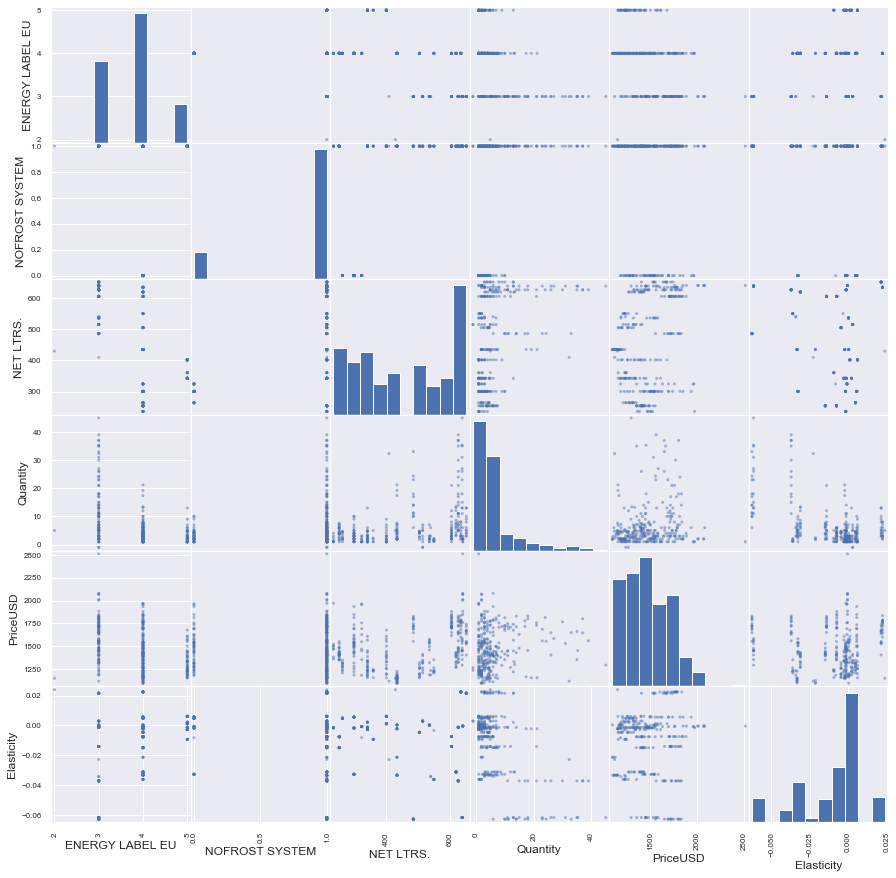

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       576.000000      576.000000  576.000000  576.000000  576.000000   
mean          3.434028        0.845486  316.760417  112.166659  543.969926   
std           0.496059        0.361755   30.452270  108.017886   51.067864   
min           3.000000        0.000000  237.000000    1.000000  426.682652   
25%           3.000000        1.000000  302.000000   17.432692  505.424286   
50%           3.000000        1.000000  310.000000   80.500000  537.166577   
75%           4.000000        1.000000  344.000000  175.648845  577.385434   
max           4.000000        1.000000  367.000000  419.615385  720.676137   

       Elasticity  
count  576.000000  
mean     0.023621  
std      1.086564  
min     -5.370740  
25%     -0.251111  
50%      0.037675  
75%      0.383805  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

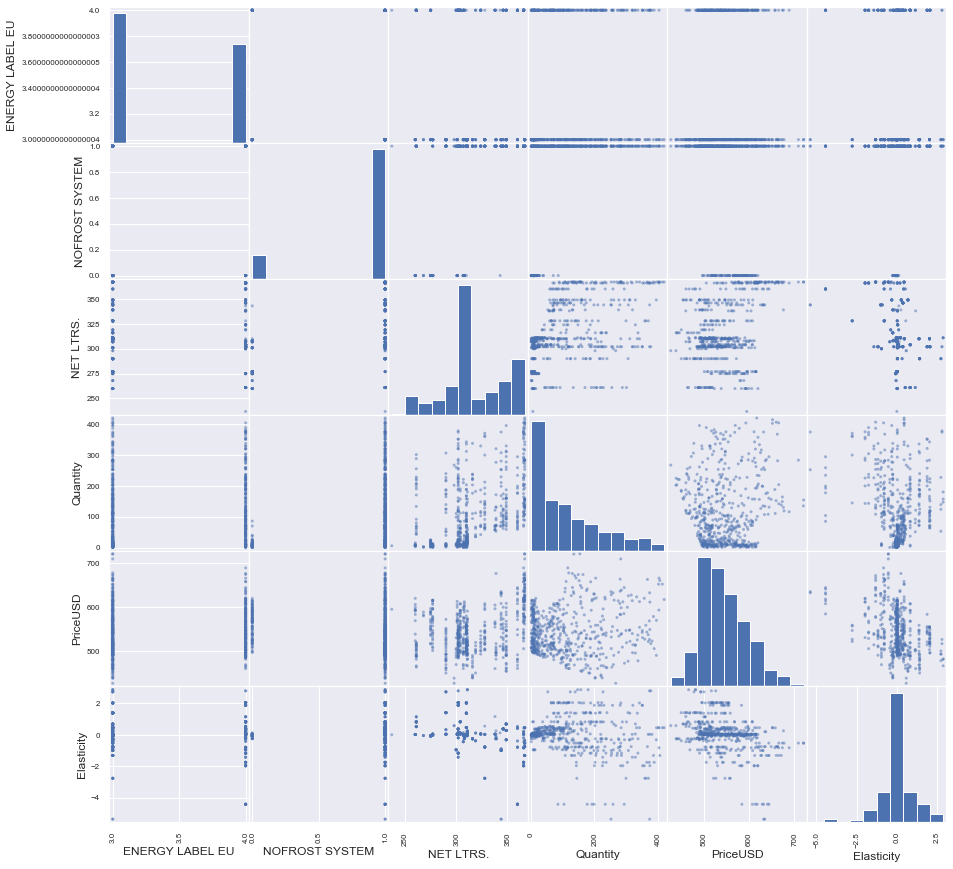

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       642.000000      642.000000  642.000000  642.000000  642.000000   
mean          2.869159        0.043614  279.652648    9.695509  281.156881   
std           0.581849        0.204393   28.218933    8.839000   26.459364   
min           1.000000        0.000000  209.000000    1.000000  199.793125   
25%           3.000000        0.000000  265.000000    3.000000  265.343349   
50%           3.000000        0.000000  279.000000    7.000000  283.444760   
75%           3.000000        0.000000  300.000000   14.000000  300.906961   
max           4.000000        1.000000  360.000000   59.300000  336.068193   

       Elasticity  
count  642.000000  
mean     0.025608  
std      0.344472  
min     -2.345111  
25%     -0.071099  
50%      0.027097  
75%      0.112383  
max      2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

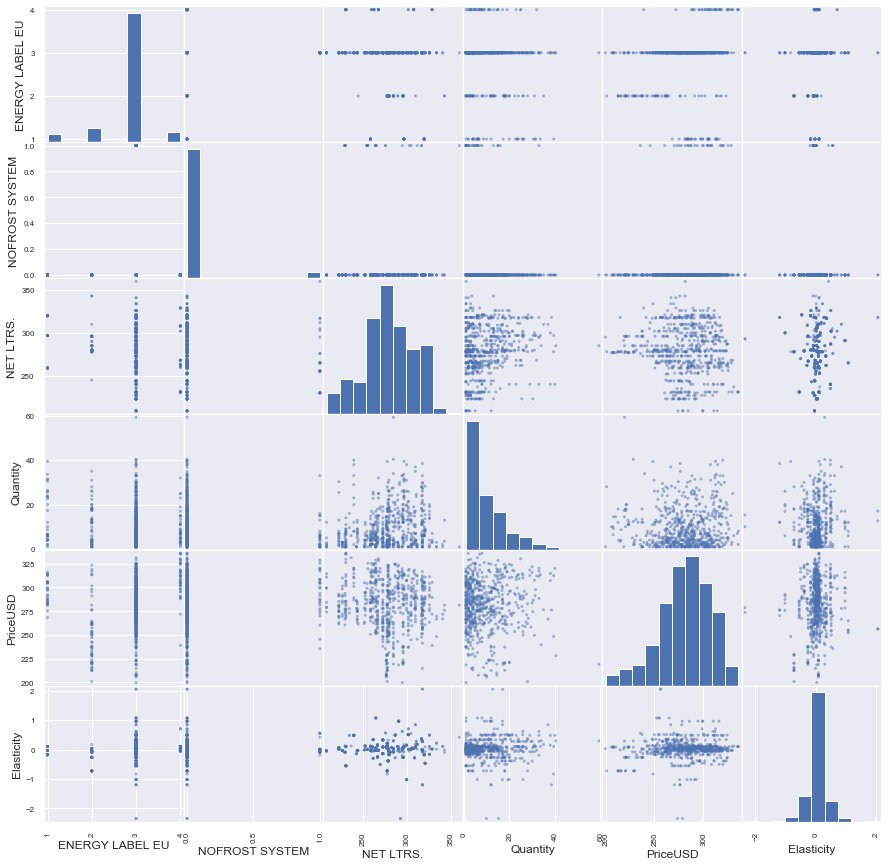

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       571.000000      571.000000  571.000000  571.000000  571.000000   
mean          3.338004        0.875657  357.598949   11.759590  556.593321   
std           0.509154        0.330262   28.274505   11.981261   37.216319   
min           2.000000        0.000000  318.000000   -1.000000  463.239086   
25%           3.000000        1.000000  334.000000    3.000000  526.963853   
50%           3.000000        1.000000  357.000000    7.000000  558.912501   
75%           4.000000        1.000000  367.000000   16.000000  585.239582   
max           4.000000        1.000000  455.000000   90.000000  656.881750   

       Elasticity  
count  571.000000  
mean     0.009959  
std      0.127041  
min     -0.821023  
25%     -0.036511  
50%      0.009044  
75%      0.032841  
max      0.558278  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

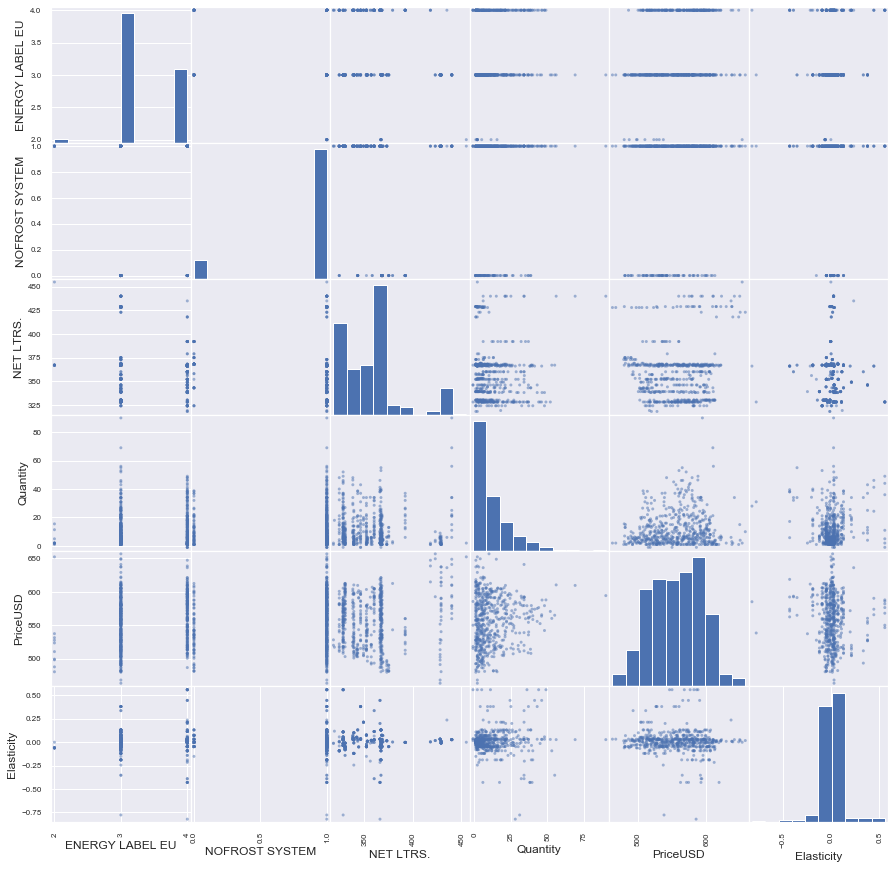

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       549.000000      549.000000  549.000000  549.000000  549.000000   
mean          2.990893        0.153005  333.025501   14.871173  352.324604   
std           0.364868        0.360321   13.516659   12.270002   30.492322   
min           1.000000        0.000000  298.000000   -1.000000  270.477737   
25%           3.000000        0.000000  321.000000    5.000000  328.360782   
50%           3.000000        0.000000  334.000000   11.000000  353.095464   
75%           3.000000        0.000000  341.000000   23.000000  375.796449   
max           4.000000        1.000000  373.000000   63.300000  416.784182   

       Elasticity  
count  549.000000  
mean    -0.012246  
std      0.423745  
min     -2.814364  
25%     -0.151526  
50%     -0.003423  
75%      0.089745  
max      1.952064  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

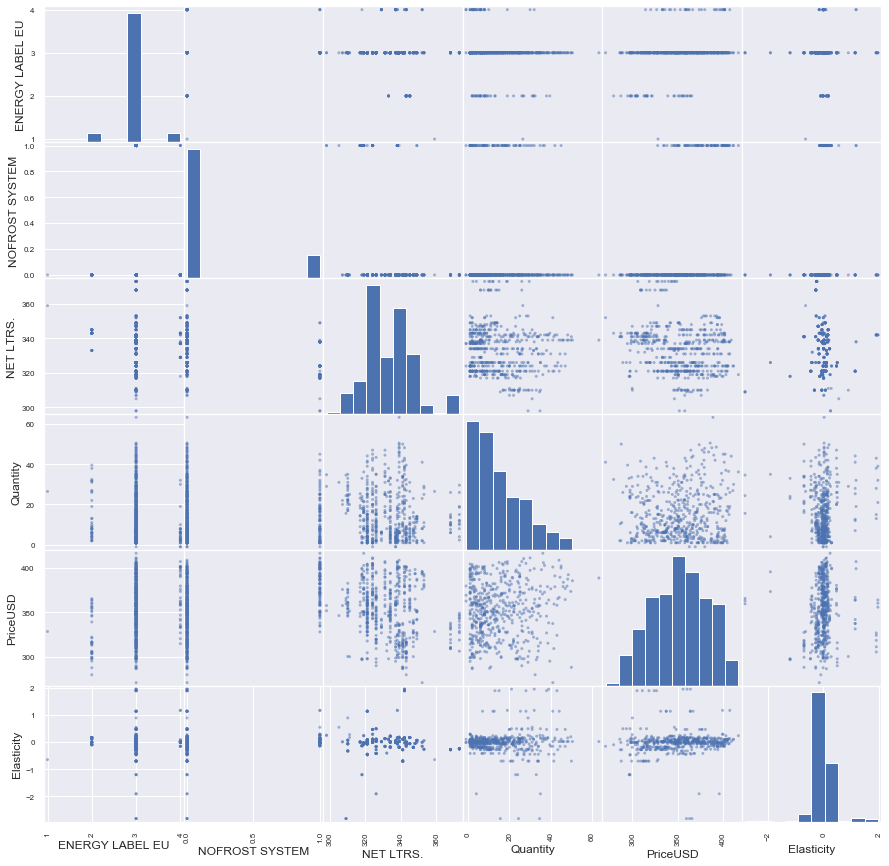

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count       415.000000      415.000000  415.000000   415.000000  415.000000   
mean          3.079518        0.197590  230.438554   271.317237  302.514125   
std           0.270872        0.398662   82.229650   284.201755  133.571869   
min           3.000000        0.000000   90.000000     1.000000  107.239559   
25%           3.000000        0.000000  152.000000    14.000000  209.663641   
50%           3.000000        0.000000  212.000000   207.836532  253.144937   
75%           3.000000        0.000000  302.000000   426.500000  352.061210   
max           4.000000        1.000000  384.000000  1590.000000  663.039242   

       Elasticity  
count  415.000000  
mean    -0.906645  
std      4.302386  
min    -22.929611  
25%     -1.007025  
50%     -0.090525  
75%      0.195481  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

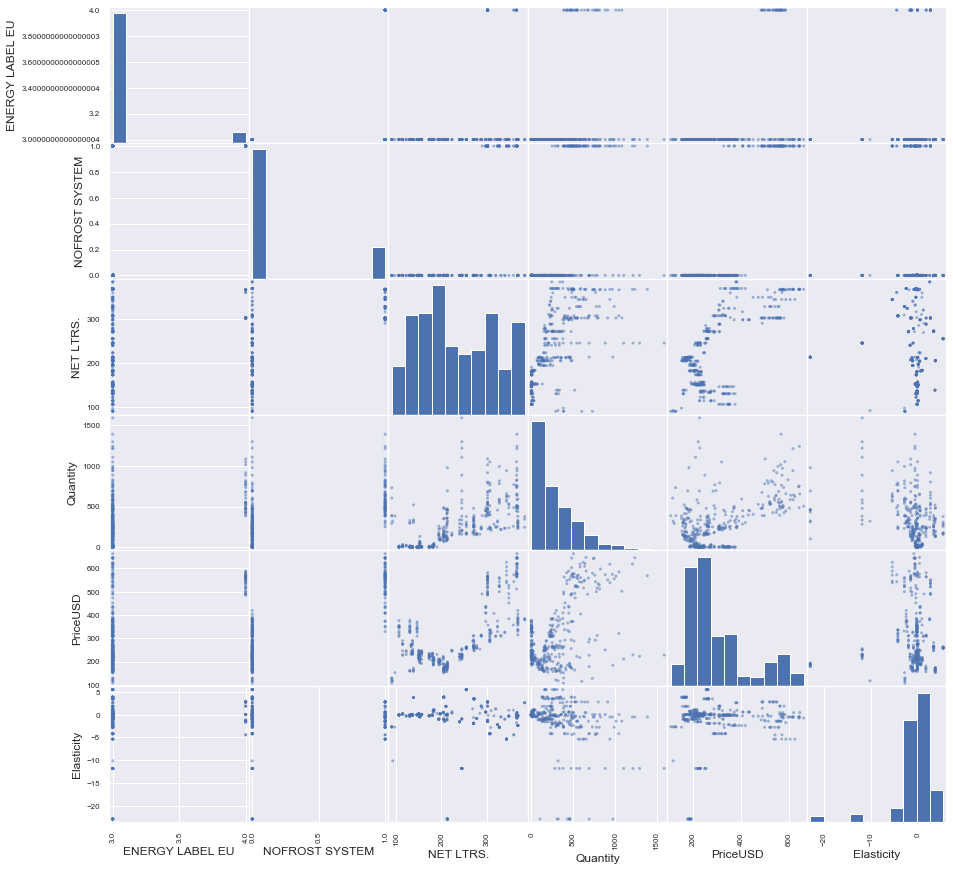

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       471.000000      471.000000  471.000000  471.000000  471.000000   
mean          3.048832        0.269639  284.059448    7.399350  357.697852   
std           0.325762        0.444244   24.842582    6.772777   31.867230   
min           2.000000        0.000000  224.000000    1.000000  309.035554   
25%           3.000000        0.000000  266.000000    3.000000  334.398388   
50%           3.000000        0.000000  295.000000    5.000000  350.984914   
75%           3.000000        1.000000  302.000000   10.000000  373.365605   
max           4.000000        1.000000  312.000000   40.166667  475.665161   

       Elasticity  
count  471.000000  
mean     0.024101  
std      0.198531  
min     -1.020821  
25%     -0.052374  
50%      0.010796  
75%      0.069637  
max      0.966658  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

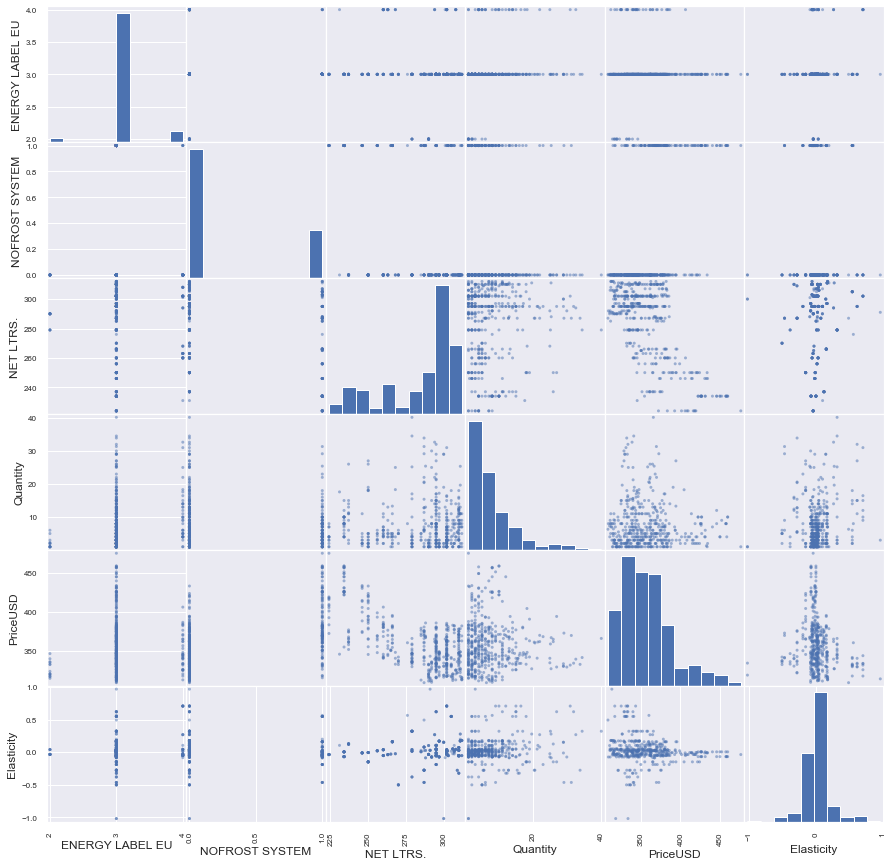

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       522.000000      522.000000  522.000000  522.000000  522.000000   
mean          2.875479        0.003831  230.821839   32.763790  230.488133   
std           0.403692        0.061839   26.342365   29.500970   30.868922   
min           1.000000        0.000000  183.000000   -2.000000  161.060500   
25%           3.000000        0.000000  210.000000    8.541667  208.731402   
50%           3.000000        0.000000  223.000000   25.075000  230.000355   
75%           3.000000        0.000000  245.000000   48.522768  252.214348   
max           4.000000        1.000000  321.000000  137.000000  328.284262   

       Elasticity  
count  522.000000  
mean     0.079817  
std      0.802847  
min     -2.345111  
25%     -0.128656  
50%      0.024067  
75%      0.378136  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

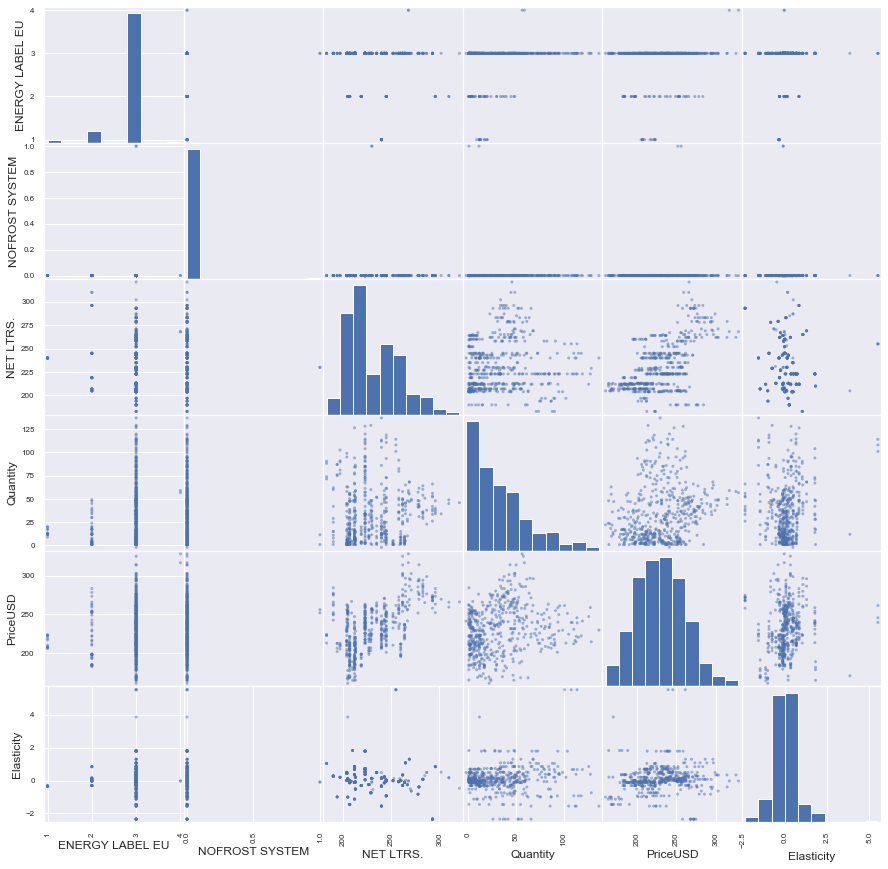

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       367.000000      367.000000  367.000000  367.000000   367.000000   
mean          3.599455        0.776567  333.392371    9.235603   843.588701   
std           0.669638        0.417115   71.788881   11.598399   287.815343   
min           2.000000        0.000000  152.000000   -3.000000    82.240372   
25%           3.000000        1.000000  300.000000    2.000000   844.531550   
50%           4.000000        1.000000  356.000000    5.000000   938.614312   
75%           4.000000        1.000000  366.000000   11.000000  1010.089551   
max           5.000000        1.000000  455.000000   81.000000  1137.904010   

       Elasticity  
count  367.000000  
mean     0.019848  
std      0.276561  
min     -0.438826  
25%     -0.025436  
50%     -0.008155  
75%      0.010737  
max      3.857916  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

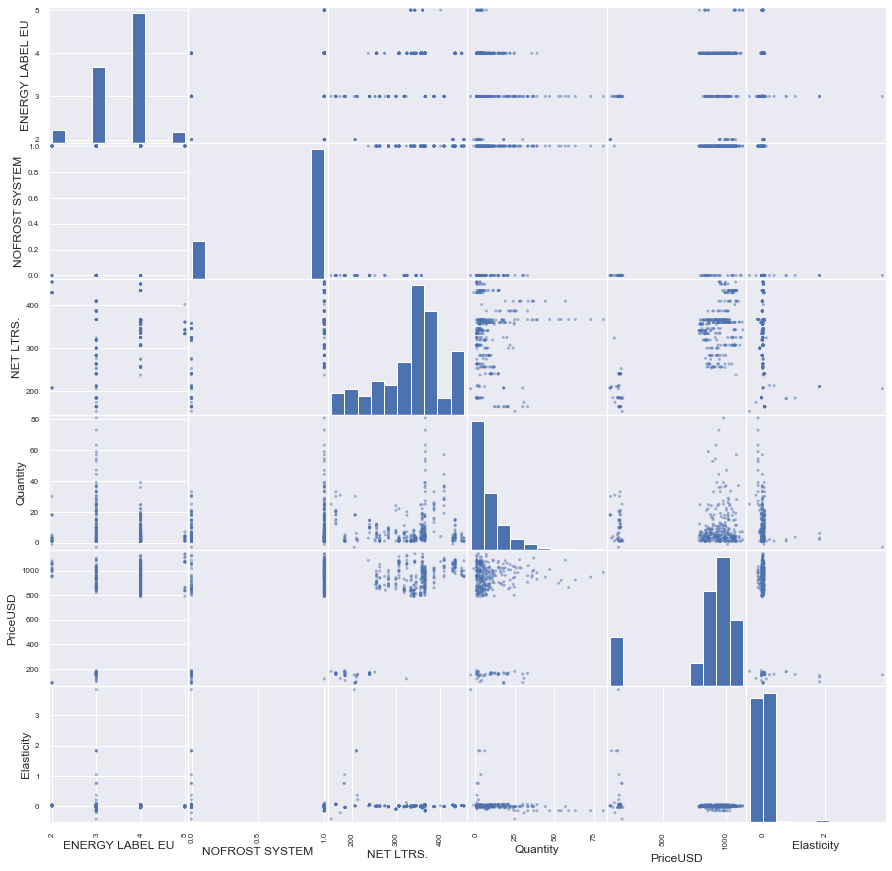

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       595.000000      595.000000  595.000000  595.000000  595.000000   
mean          3.625210        0.789916  327.198319   19.263067  680.867168   
std           0.491377        0.407711   55.997574   22.046807   50.175143   
min           3.000000        0.000000    0.000000    1.000000  595.367698   
25%           3.000000        1.000000  308.000000    4.000000  639.168953   
50%           4.000000        1.000000  341.000000    9.132075  670.940045   
75%           4.000000        1.000000  360.000000   26.750000  715.734334   
max           5.000000        1.000000  379.000000  101.200000  827.670944   

       Elasticity  
count  595.000000  
mean    -0.109576  
std      0.432390  
min     -5.370740  
25%     -0.092748  
50%     -0.014254  
75%      0.002883  
max      0.558278  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

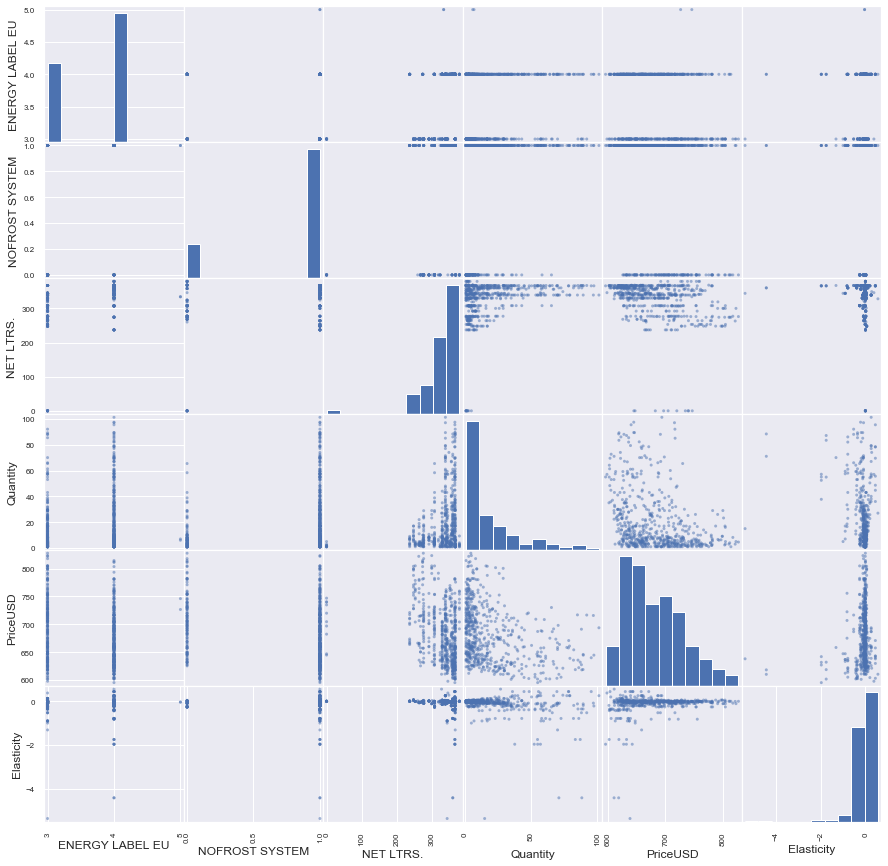

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       436.000000      436.000000  436.000000  436.000000  436.000000   
mean          3.238532        0.908257  295.162844   15.496822  429.587612   
std           0.487057        0.288995   16.725329   15.975090   25.453348   
min           2.000000        0.000000  246.000000    1.000000  376.535880   
25%           3.000000        1.000000  287.000000    4.000000  409.494517   
50%           3.000000        1.000000  301.000000   10.000000  429.021601   
75%           4.000000        1.000000  307.000000   21.585000  448.183509   
max           4.000000        1.000000  324.000000   84.100000  497.453630   

       Elasticity  
count  436.000000  
mean     0.080060  
std      0.462391  
min     -0.952429  
25%     -0.076044  
50%      0.005319  
75%      0.102285  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

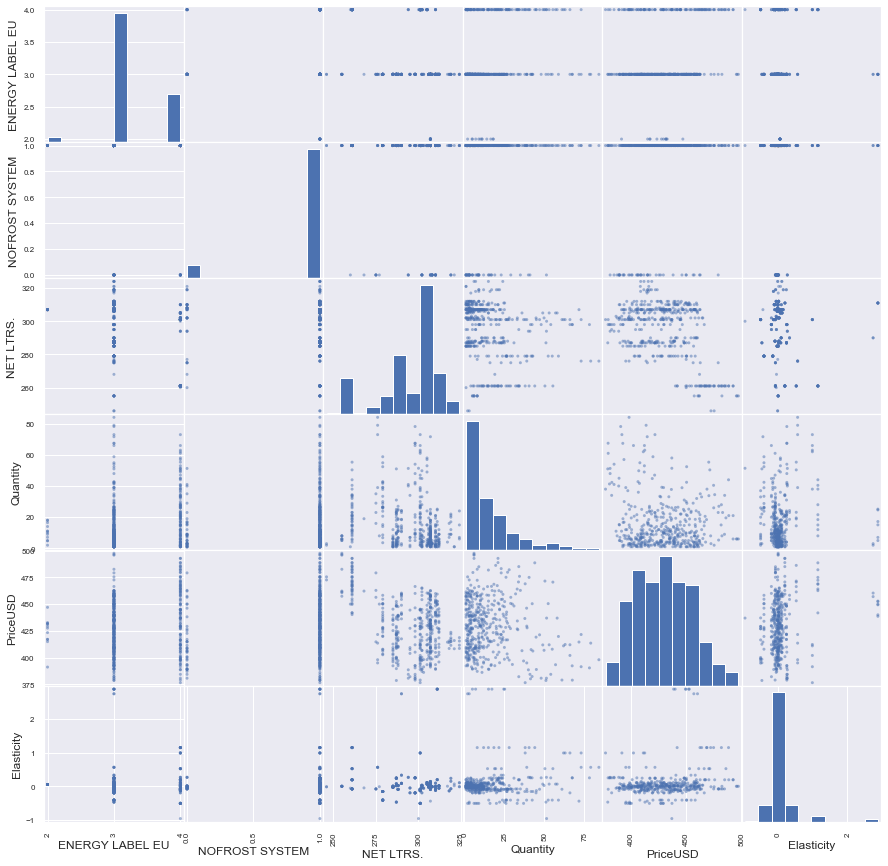

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       555.000000      555.000000  555.000000  555.000000  555.000000   
mean          2.882883        0.081081  330.585586   83.746010  341.076199   
std           0.497988        0.273206   31.096702   46.042479   39.120998   
min           1.000000        0.000000  265.000000    1.000000  232.870189   
25%           3.000000        0.000000  309.000000   51.200000  312.489661   
50%           3.000000        0.000000  326.000000   76.300000  339.672407   
75%           3.000000        0.000000  359.000000  114.000000  370.955370   
max           4.000000        1.000000  393.000000  220.616667  432.364454   

       Elasticity  
count  555.000000  
mean     0.094560  
std      0.980943  
min     -2.814364  
25%     -0.402742  
50%      0.005112  
75%      0.670962  
max      2.635396  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

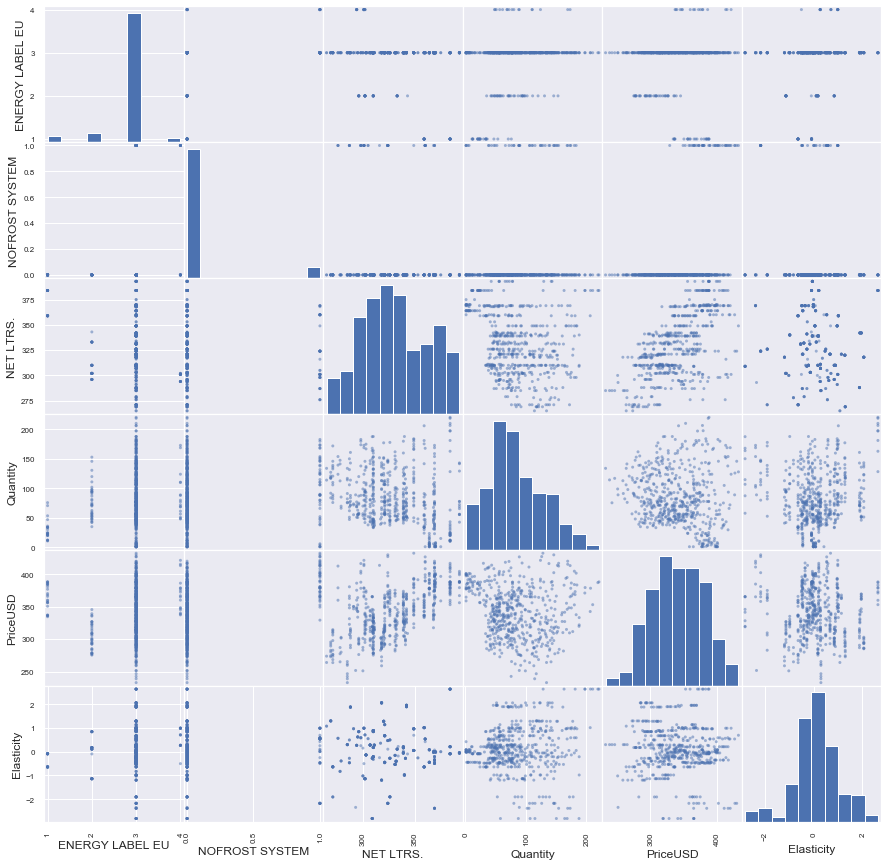

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       451.000000           451.0  451.000000  451.000000   451.000000   
mean          3.401330             1.0  512.767184   30.101965   873.173975   
std           0.508504             0.0   60.989700   40.415453   117.277716   
min           2.000000             1.0  414.000000   -1.000000   670.516351   
25%           3.000000             1.0  453.000000    3.000000   774.885837   
50%           3.000000             1.0  517.000000   10.000000   852.202250   
75%           4.000000             1.0  550.000000   43.700000   967.971420   
max           4.000000             1.0  626.000000  209.000000  1143.731528   

       Elasticity  
count  451.000000  
mean    -0.088613  
std      0.265628  
min     -0.809636  
25%     -0.227900  
50%     -0.013678  
75%      0.010737  
max      0.462785  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 1.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


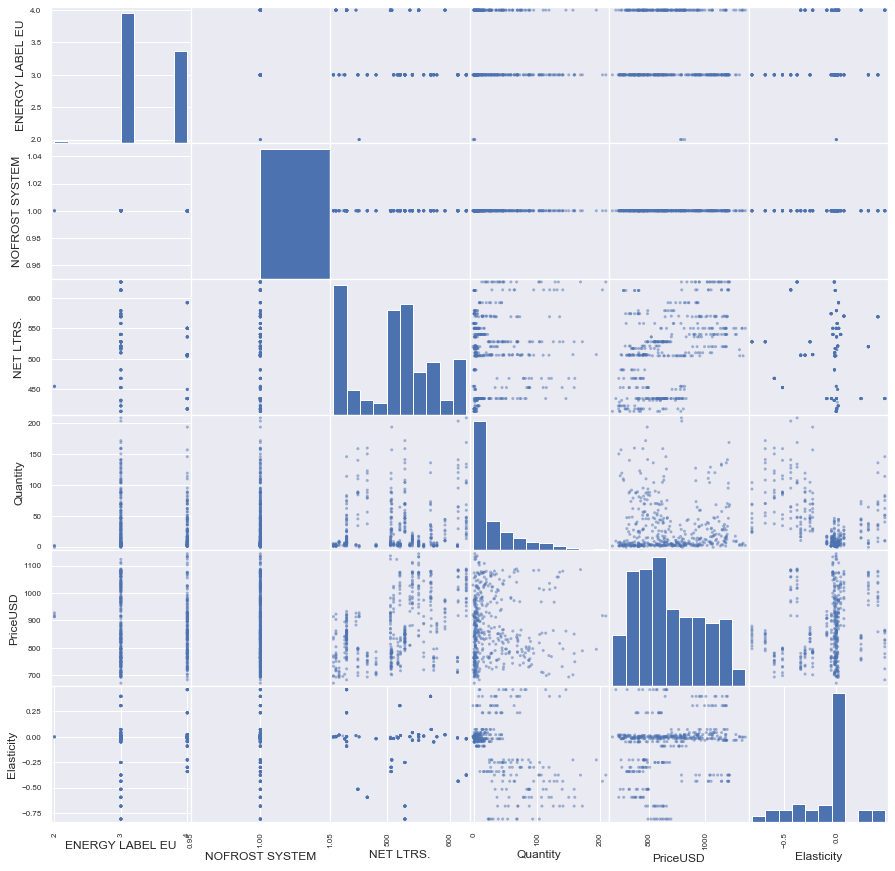

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       527.000000      527.000000  527.000000  527.000000  527.000000   
mean          2.939279        0.134725  147.948767   42.948211  200.296054   
std           0.314591        0.341754  147.710729   57.094991  156.345517   
min           2.000000        0.000000    0.000000   -1.000000    0.000000   
25%           3.000000        0.000000   82.000000    5.000000  119.397873   
50%           3.000000        0.000000   97.000000   15.000000  148.175359   
75%           3.000000        0.000000  124.000000   61.600820  180.377999   
max           4.000000        1.000000  579.000000  261.000000  682.788432   

       Elasticity  
count  527.000000  
mean    -0.228794  
std      2.087521  
min    -10.147207  
25%     -0.351548  
50%      0.007895  
75%      0.480163  
max      3.772702  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

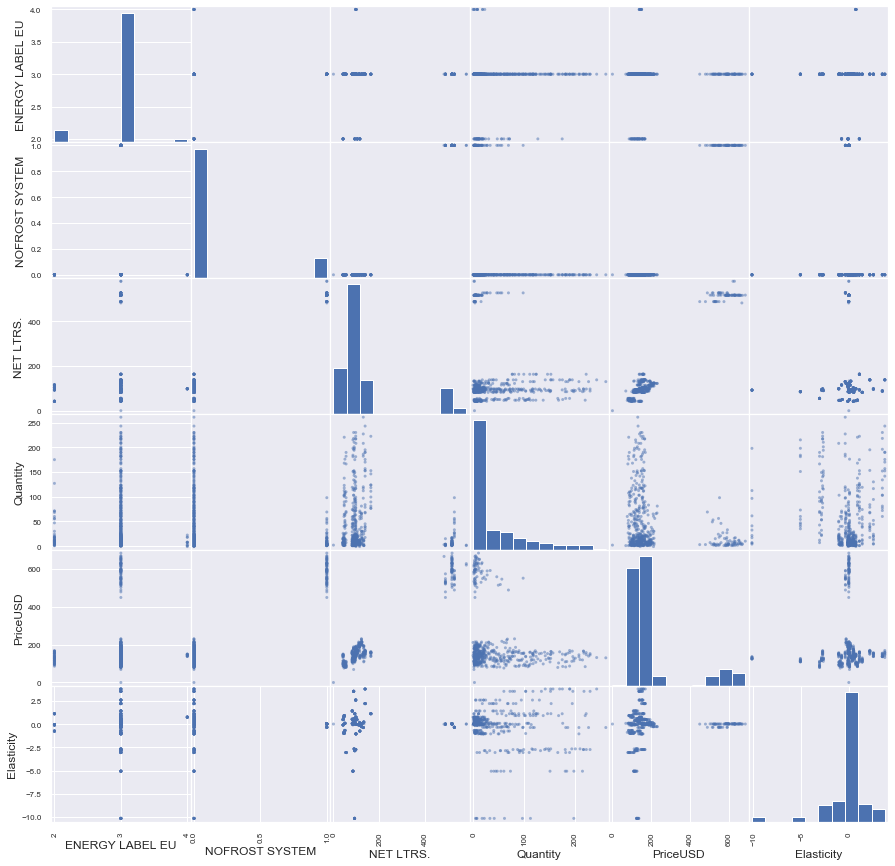

In [30]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Далі побудуємо кластеризації за допомогою ієрархічного методу

In [31]:
def fancy_dendrogram(*args, **kwargs):#функія побудови дендрограми
    sns.set()
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)
    ddata = dendrogram(*args, **kwargs)
    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

In [32]:
def lokot(data_linkage):# метод ліктя - найбільш оптимальна кількість сегментів
    last = data_linkage[-20:, 2] 
    last_rev = last[::-1]
    idxs = np.arange(1, len(last) + 1)
    plt.plot(idxs, last_rev)
    acceleration = np.diff(last, 2)  
    acceleration_rev = acceleration[::-1]
    plt.plot(idxs[:-2] + 1, acceleration_rev)
    plt.show()
    k = acceleration_rev.argmax() + 2 
    print("clusters:", k)

In [ ]:
for method in ['ward', 'centroid', 'weighted', 'average', 'complete']:# за допомогою цього отримуємо оцінки для всіх комбінацій
    for metric in ['euclidean','cityblock','seuclidean','sqeuclidean','cosine','correlation','hamming','chebyshev','canberra','braycurtis']:
        print(method + ' ' + metric)
        print('Можлива к-ть класів')
        for i in range(2,20):
            dist = pdist(digits_proj, metric)
            link = linkage(dist, method=method)
            cluster=fcluster(link, i, criterion='maxclust')
            c = silhouette_score(digits_proj, cluster, metric=metric, sample_size=6000)
            ch = calinski_harabasz_score(digits_proj, cluster)
            db = davies_bouldin_score(digits_proj, cluster)
            if(c>0):
                print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))

In [33]:
data_dist = pdist(dataNorm, 'sqeuclidean') # побудова матриці відстаней

In [34]:
data_linkage = linkage(data_dist, method='ward') # об'єднання елементів у кластери

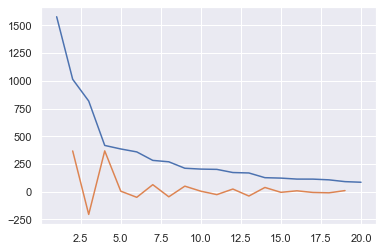

clusters: 4


In [35]:
lokot(data_linkage)

In [36]:
clustering_criterion_ierarhi(dataNorm, 'ward', 'sqeuclidean')

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.9354280969154476
calinski harabasz score: 752.2147838799174
davies_bouldin_score: 0.5862469816206451
Clusters: 3
silhouette_score: 0.8970616690738352
calinski harabasz score: 721.7853244700699
davies_bouldin_score: 0.7270525619013859
Clusters: 4
silhouette_score: 0.488436099848063
calinski harabasz score: 1964.7614848197127
davies_bouldin_score: 0.9709877781045599
Clusters: 5
silhouette_score: 0.461724451199413
calinski harabasz score: 2009.955084119885
davies_bouldin_score: 1.0911134958983226
Clusters: 6
silhouette_score: 0.4575934406150865
calinski harabasz score: 1693.0362292334198
davies_bouldin_score: 0.9414044861940729
Clusters: 7
silhouette_score: 0.4815643886044578
calinski harabasz score: 1684.4782334543752
davies_bouldin_score: 0.9815047278366069
Clusters: 8
silhouette_score: 0.45081826170202005
calinski harabasz score: 1932.3771914053057
davies_bouldin_score: 0.922821726904335
Clusters: 9
silhouette_score: 0.457298613820380

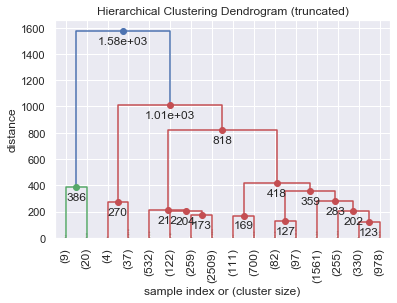

In [37]:
nCluster=16# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [38]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

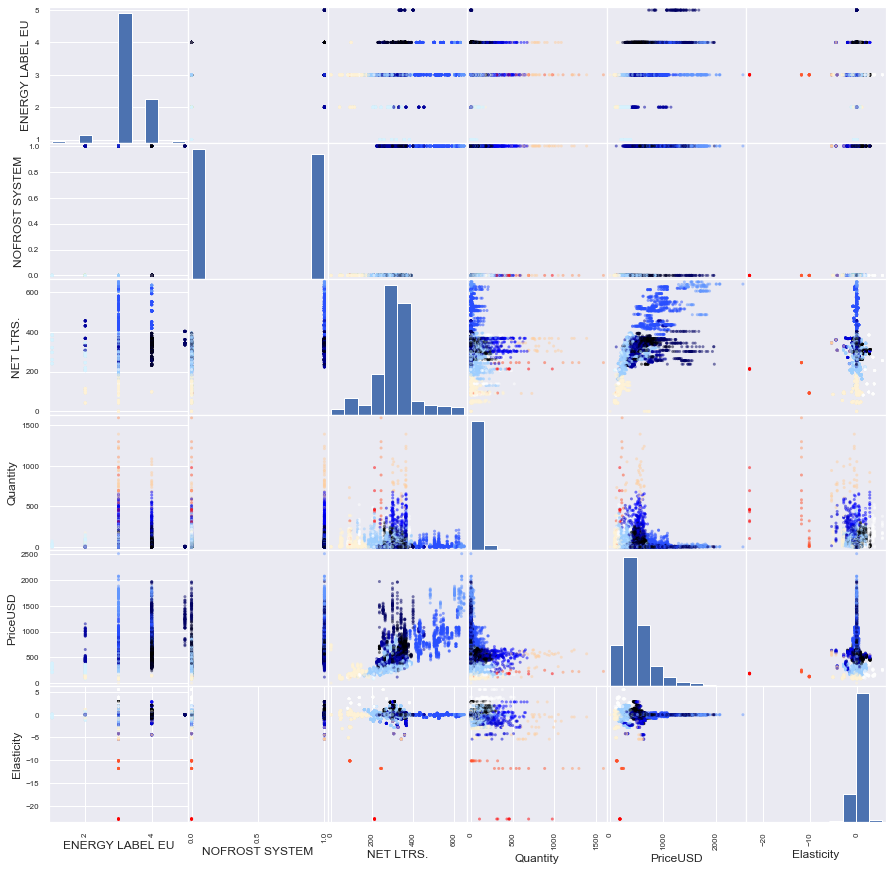

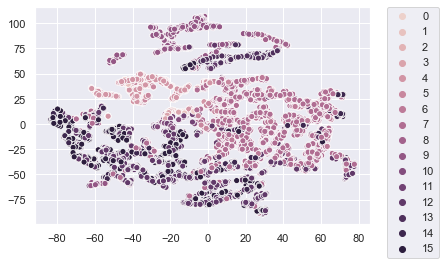

In [39]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [40]:
data['cluster_ier_we_16']=clusters

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count              9.0             9.0        9.0    9.000000    9.000000   
mean               3.0             0.0      213.0  469.000000  186.047872   
std                0.0             0.0        0.0  247.244818    5.413783   
min                3.0             0.0      213.0  104.000000  178.051725   
25%                3.0             0.0      213.0  324.000000  183.187402   
50%                3.0             0.0      213.0  457.000000  187.211267   
75%                3.0             0.0      213.0  464.000000  188.549703   
max                3.0             0.0      213.0  977.000000  193.524693   

       Elasticity  
count    9.000000  
mean   -22.929611  
std      0.000000  
min    -22.929611  
25%    -22.929611  
50%    -22.929611  
75%    -22.929611  
max    -22.929611  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN           

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 3.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 3.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 213.0 results in singular transformations; automatically expanding.
  ax.set_xli

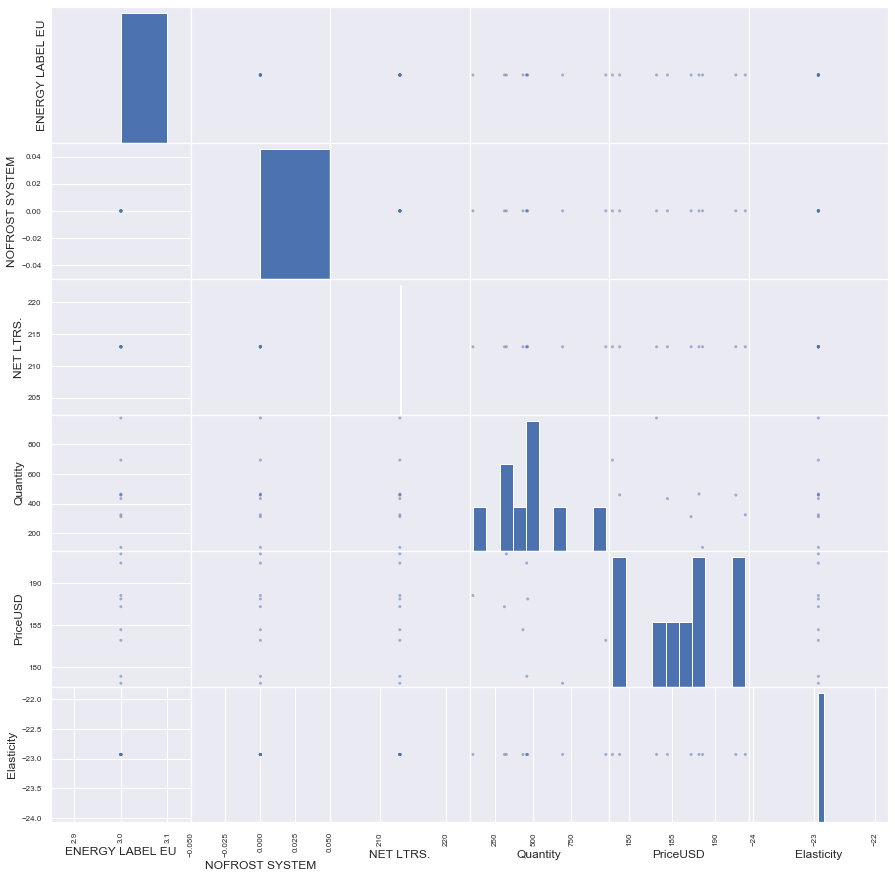

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count             20.0            20.0   20.000000   20.000000   20.000000   
mean               3.0             0.0  153.200000  255.006350  170.688923   
std                0.0             0.0   76.901578  265.182363   55.122318   
min                3.0             0.0   92.000000    4.000000  117.240770   
25%                3.0             0.0   92.000000   29.687893  125.660372   
50%                3.0             0.0   92.000000  155.135344  133.604524   
75%                3.0             0.0  245.000000  406.000000  228.088971   
max                3.0             0.0  245.000000  885.500000  255.354381   

       Elasticity  
count   20.000000  
mean   -10.814720  
std      0.838770  
min    -11.815988  
25%    -11.815988  
50%    -10.147207  
75%    -10.147207  
max    -10.147207  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

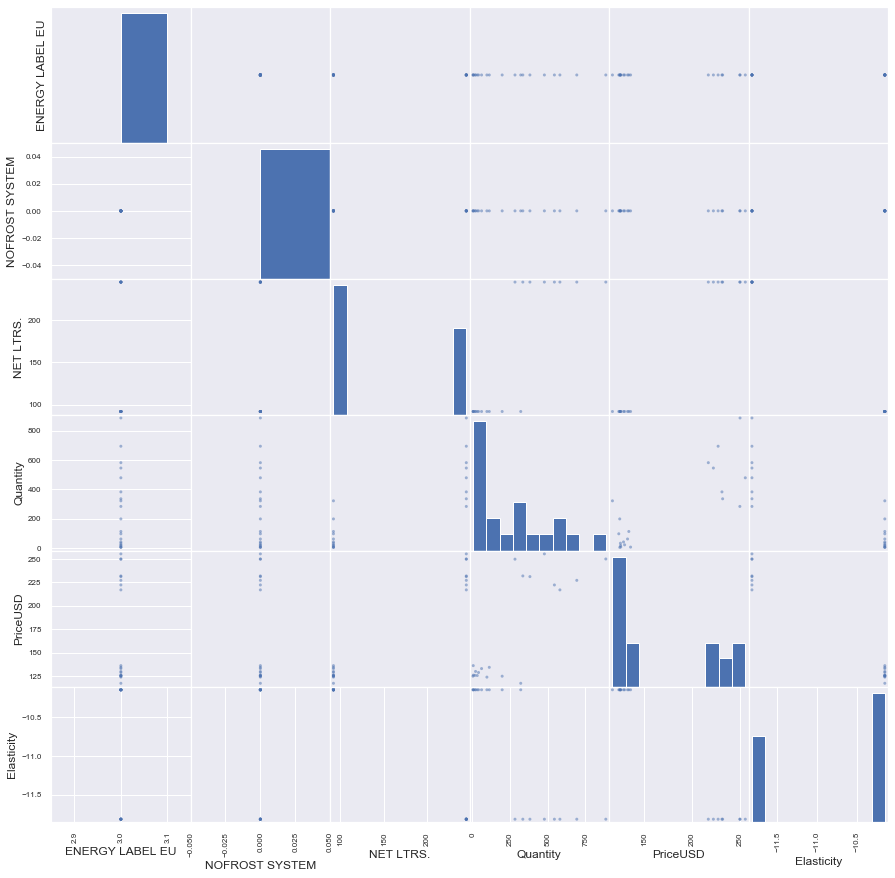

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.     Quantity    PriceUSD  \
count              4.0             4.0        4.0     4.000000    4.000000   
mean               3.0             0.0      245.0  1302.500000  222.368449   
std                0.0             0.0        0.0   206.922691    8.084868   
min                3.0             0.0      245.0  1106.000000  210.926413   
25%                3.0             0.0      245.0  1190.000000  219.560679   
50%                3.0             0.0      245.0  1257.000000  224.993510   
75%                3.0             0.0      245.0  1369.500000  227.801280   
max                3.0             0.0      245.0  1590.000000  228.560364   

       Elasticity  
count    4.000000  
mean   -11.815988  
std      0.000000  
min    -11.815988  
25%    -11.815988  
50%    -11.815988  
75%    -11.815988  
max    -11.815988  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 245.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == -11.815988164088374 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 245.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 245.0 results in singular transformations; automatically exp

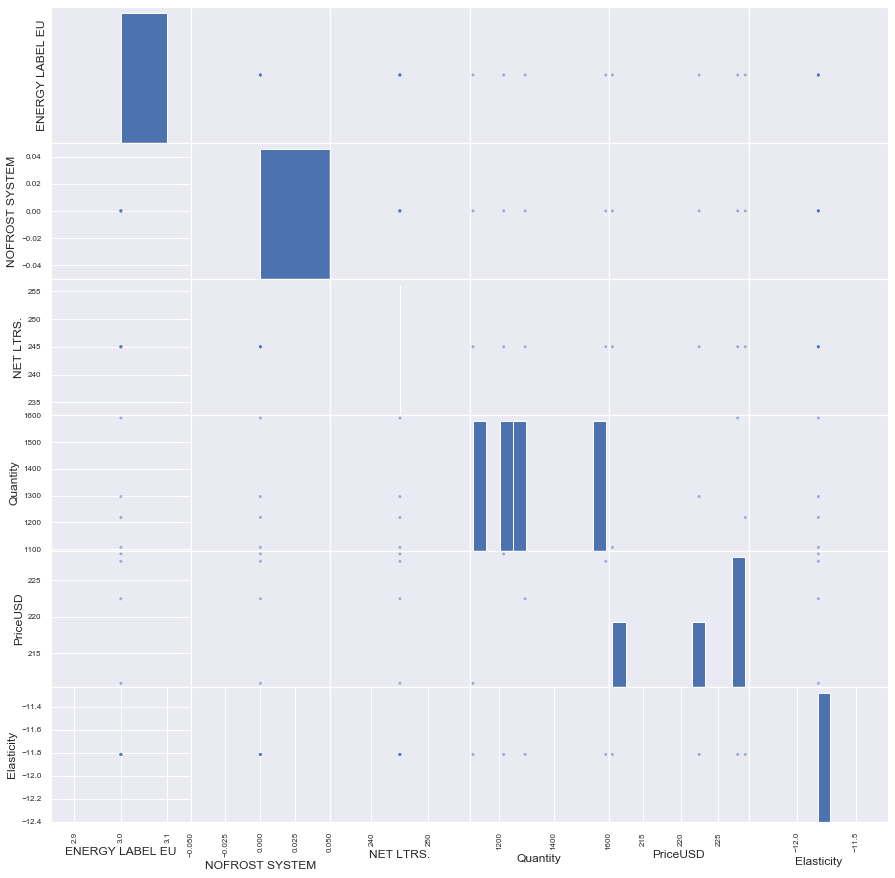

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count        37.000000       37.000000   37.000000    37.000000   37.000000   
mean          3.351351        0.810811  325.972973   831.908380  510.214511   
std           0.483978        0.397061   62.886355   198.953905  137.717940   
min           3.000000        0.000000   90.000000   486.130000  115.165367   
25%           3.000000        1.000000  307.000000   697.000000  511.505616   
50%           3.000000        1.000000  344.000000   788.650000  558.595007   
75%           4.000000        1.000000  366.000000   941.100000  584.588007   
max           4.000000        1.000000  367.000000  1388.679739  645.429020   

       Elasticity  
count   37.000000  
mean    -2.149139  
std      2.305440  
min     -5.370740  
25%     -4.170003  
50%     -1.423114  
75%     -0.504816  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

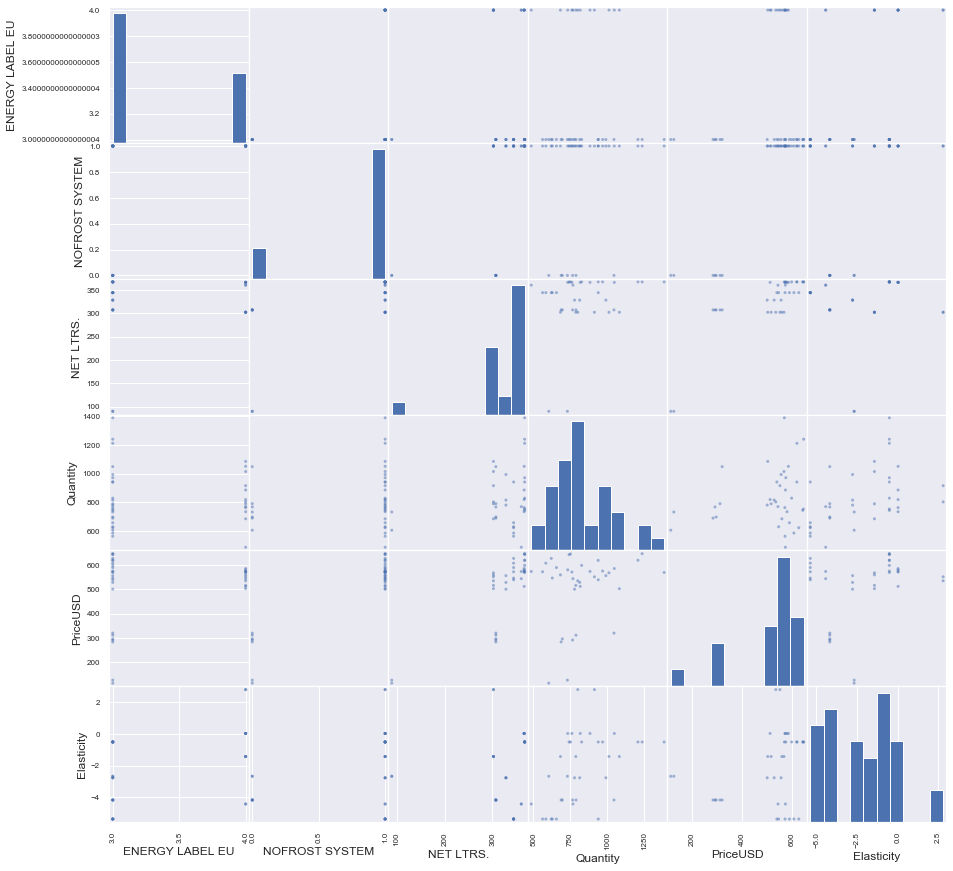

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       532.000000           532.0  532.000000  532.000000  532.000000   
mean          2.939850             0.0  101.041353   31.659123  179.239859   
std           0.313161             0.0   39.969600   53.766000   97.703014   
min           2.000000             0.0    0.000000   -1.000000    0.000000   
25%           3.000000             0.0   85.000000    4.000000  121.016102   
50%           3.000000             0.0   98.000000   10.000000  157.388617   
75%           3.000000             0.0  130.000000   30.000000  209.855443   
max           4.000000             0.0  184.000000  388.500000  746.947794   

       Elasticity  
count  532.000000  
mean    -0.338737  
std      1.163582  
min     -5.071539  
25%     -0.279169  
50%     -0.024688  
75%      0.177658  
max      1.408134  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

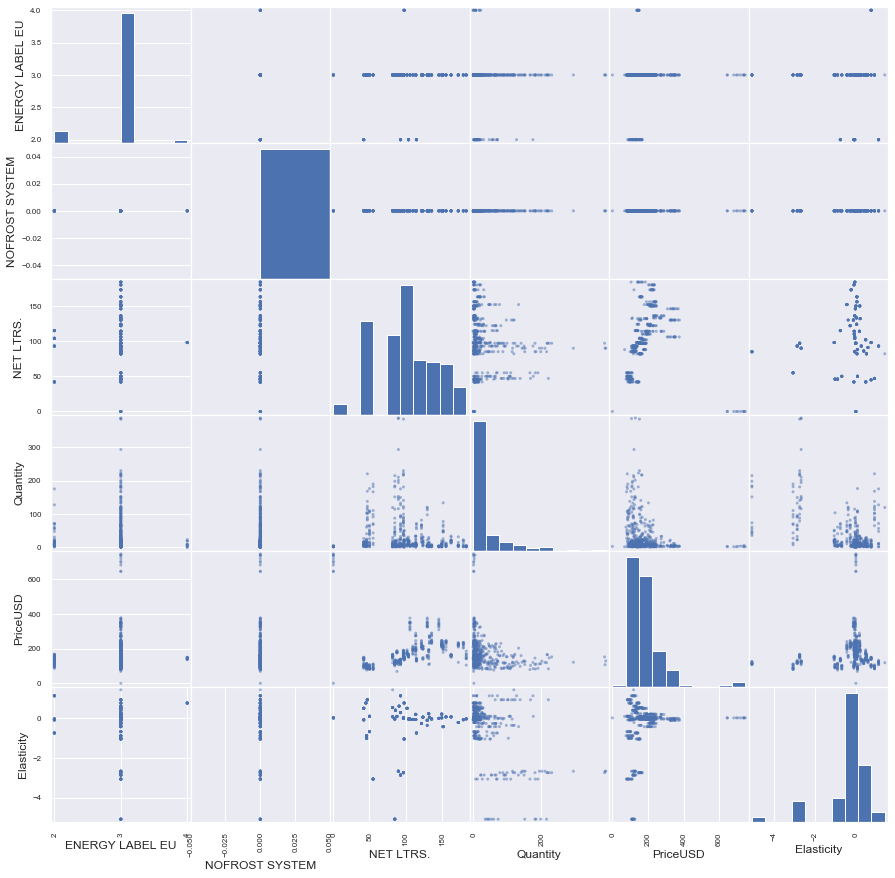

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            122.0           122.0  122.000000  122.000000  122.000000   
mean               3.0             0.0  189.073770  146.903094  198.224929   
std                0.0             0.0   91.735982  122.992199   76.007817   
min                3.0             0.0   82.000000   -3.000000   94.444739   
25%                3.0             0.0   97.000000   40.000386  148.359139   
50%                3.0             0.0  205.000000  131.000000  164.066848   
75%                3.0             0.0  255.000000  211.958649  255.277652   
max                3.0             0.0  384.000000  520.760000  388.172846   

       Elasticity  
count  122.000000  
mean     3.060465  
std      1.143802  
min      1.408134  
25%      2.200602  
50%      2.635396  
75%      3.772702  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

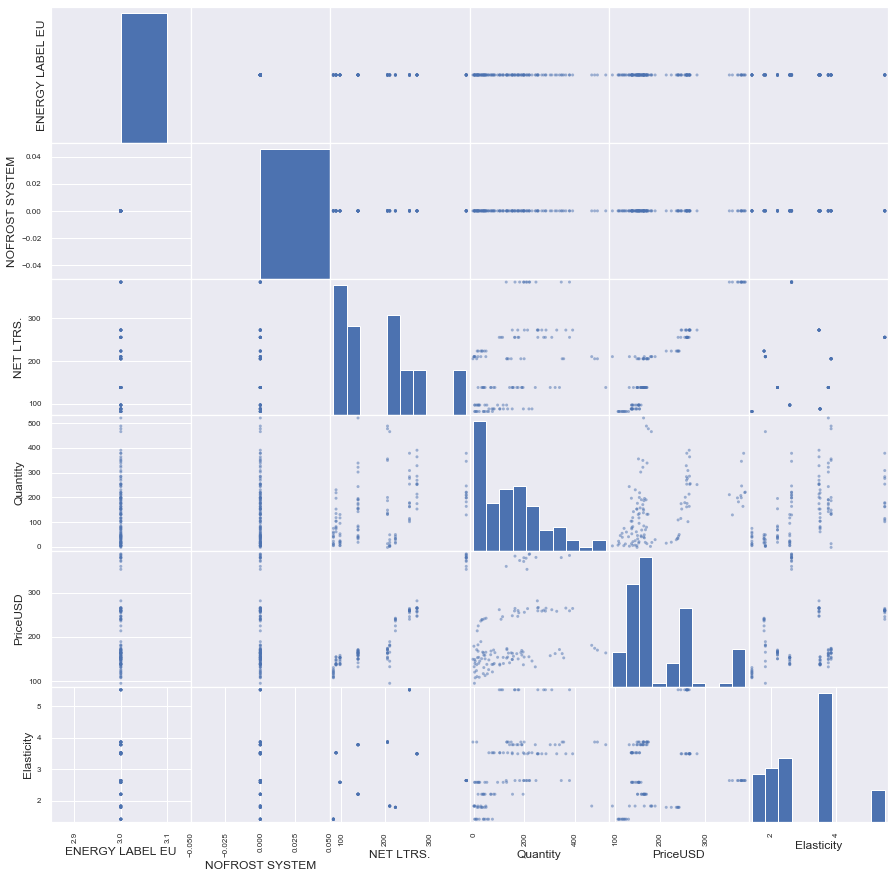

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       259.000000           259.0  259.000000  259.000000  259.000000   
mean          1.733591             0.0  294.061776   23.352487  279.890818   
std           0.442937             0.0   46.559914   27.274933   57.212799   
min           1.000000             0.0  205.000000    1.000000   82.240372   
25%           1.000000             0.0  278.000000    4.437500  236.610096   
50%           2.000000             0.0  296.000000   13.333333  287.388271   
75%           2.000000             0.0  333.000000   30.250000  316.986389   
max           2.000000             0.0  384.000000  153.000000  388.210305   

       Elasticity  
count  259.000000  
mean    -0.108787  
std      0.376901  
min     -1.138110  
25%     -0.263523  
50%     -0.035574  
75%      0.106068  
max      0.842468  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

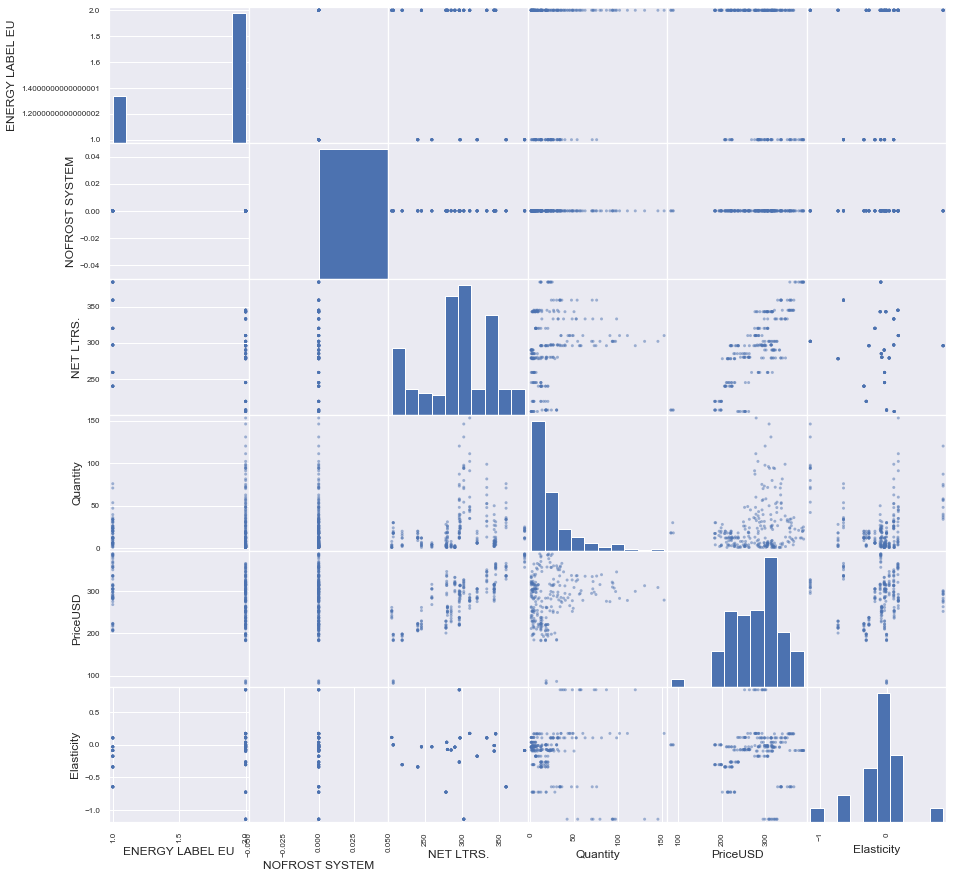

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count           2509.0          2509.0  2509.000000  2509.000000  2509.000000   
mean               3.0             0.0   290.882423    35.920128   328.254544   
std                0.0             0.0    49.863363    52.351743   108.345766   
min                3.0             0.0    98.000000    -2.000000   130.095725   
25%                3.0             0.0   260.000000     5.000000   264.913331   
50%                3.0             0.0   300.000000    14.000000   316.087486   
75%                3.0             0.0   326.000000    46.000000   362.900572   
max                3.0             0.0   393.000000   472.000000   930.692078   

        Elasticity  
count  2509.000000  
mean      0.024865  
std       0.592257  
min      -2.814364  
25%      -0.137743  
50%       0.012578  
75%       0.156145  
max       2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

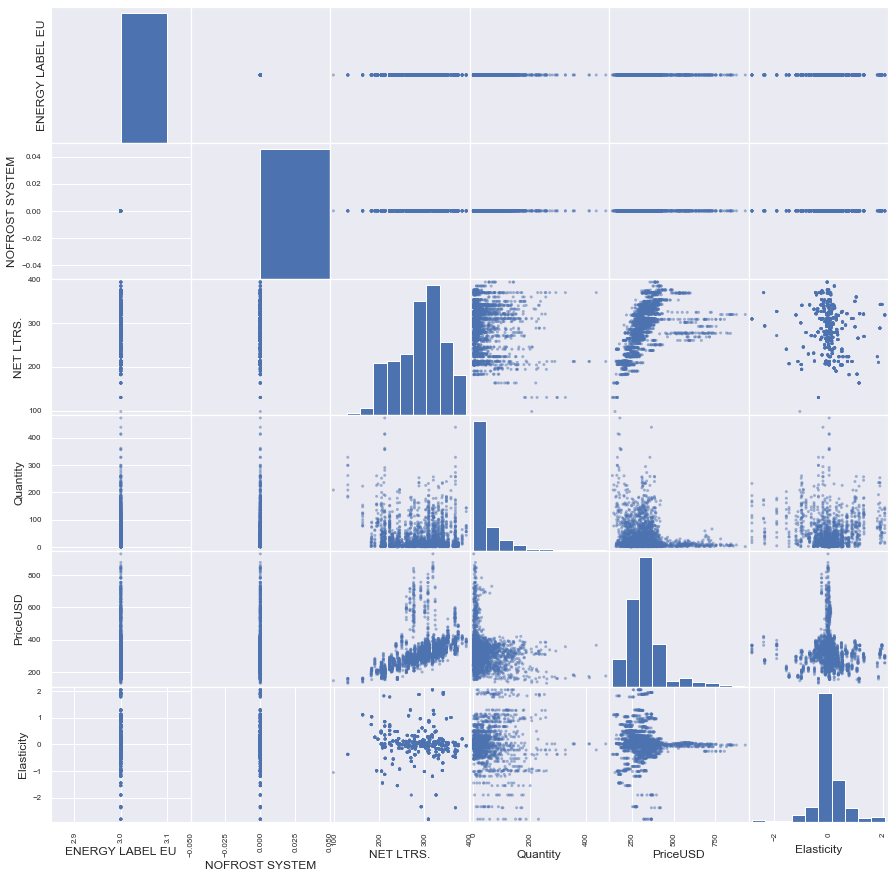

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       111.000000           111.0  111.000000  111.000000   111.000000   
mean          3.207207             1.0  606.837838   10.675278  1669.611628   
std           0.407143             0.0   49.821963   10.239221   184.910915   
min           3.000000             1.0  486.000000    1.000000  1294.542322   
25%           3.000000             1.0  605.000000    3.000000  1539.491404   
50%           3.000000             1.0  626.000000    7.000000  1697.571150   
75%           3.000000             1.0  638.000000   14.000000  1773.338663   
max           4.000000             1.0  651.000000   45.000000  2511.804930   

       Elasticity  
count  111.000000  
mean    -0.015094  
std      0.029902  
min     -0.062638  
25%     -0.037067  
50%     -0.007408  
75%      0.000227  
max      0.022406  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 1.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


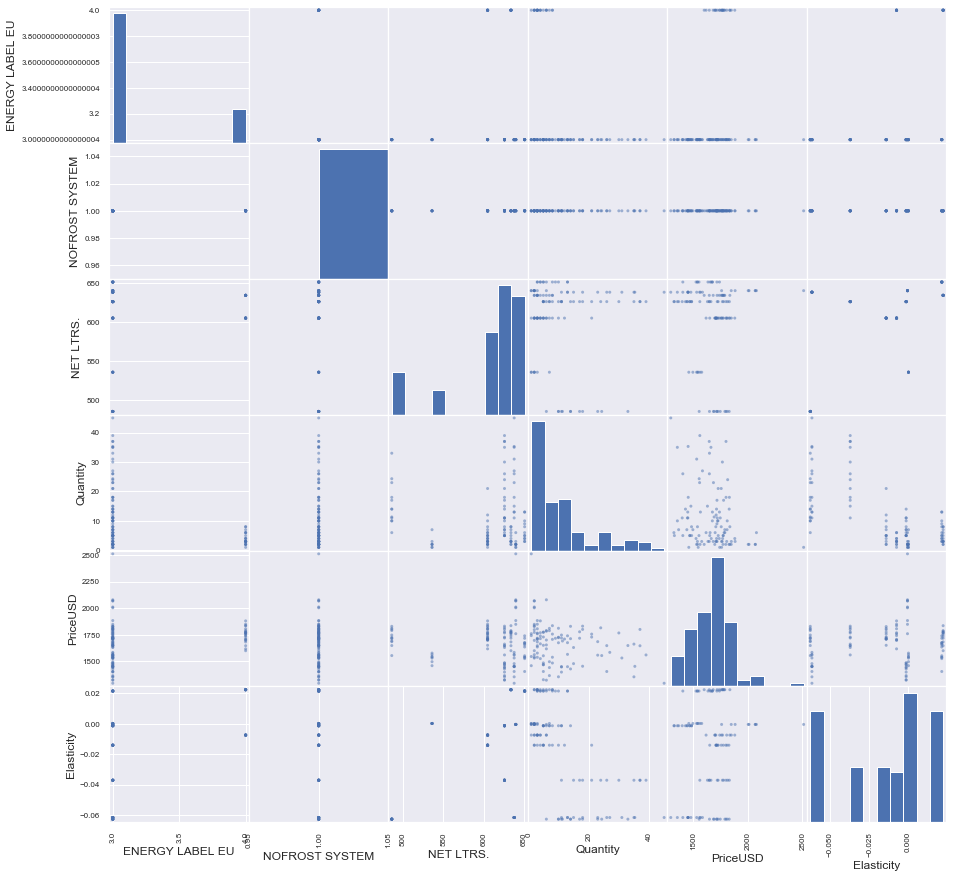

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       700.000000           700.0  700.000000  700.000000   700.000000   
mean          3.388571             1.0  497.452857   23.865634   869.442205   
std           0.487774             0.0   64.275955   34.984202   199.354508   
min           3.000000             1.0  367.000000   -1.000000   423.116329   
25%           3.000000             1.0  435.000000    3.000000   738.600270   
50%           3.000000             1.0  506.500000    7.000000   853.688101   
75%           4.000000             1.0  540.000000   29.075000  1018.099820   
max           4.000000             1.0  626.000000  209.000000  1431.694360   

       Elasticity  
count  700.000000  
mean    -0.066366  
std      0.221059  
min     -0.809636  
25%     -0.048008  
50%     -0.010006  
75%      0.008385  
max      0.462785  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

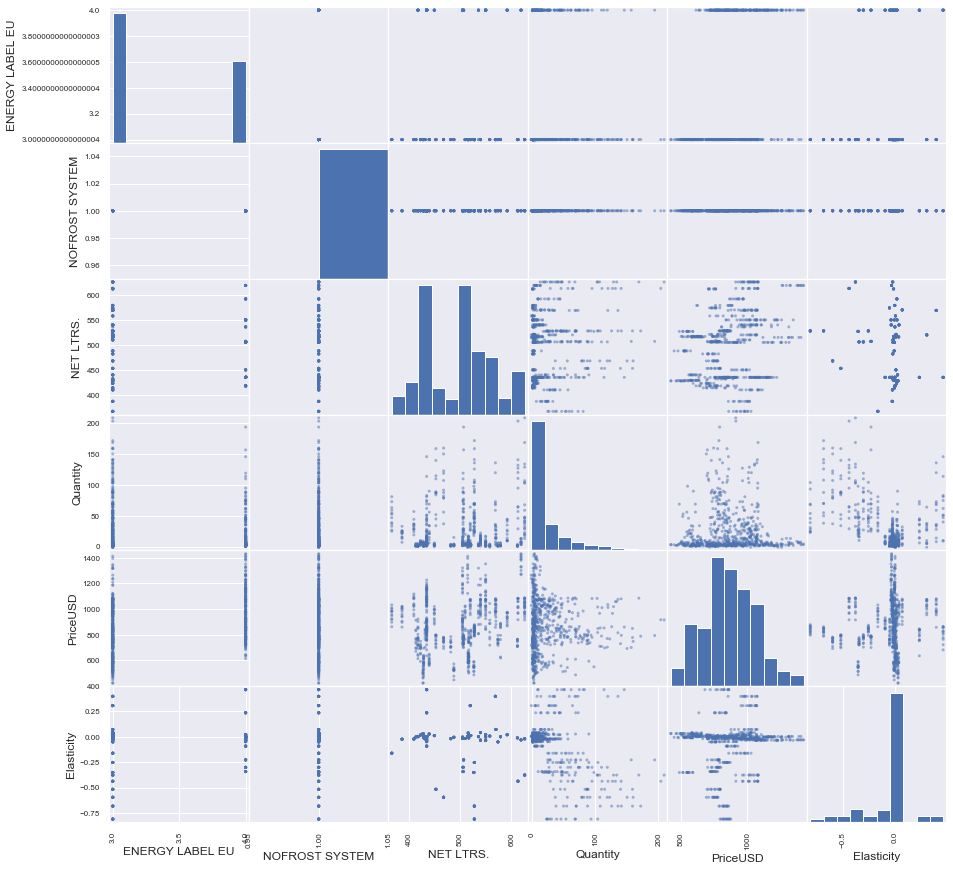

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count        82.000000            82.0   82.000000   82.000000   82.000000   
mean          3.195122             1.0  336.000000  414.536824  544.307034   
std           0.398733             0.0   28.750094  114.969973   75.536646   
min           3.000000             1.0  290.000000  253.000000  328.615769   
25%           3.000000             1.0  302.000000  313.000000  493.570272   
50%           3.000000             1.0  349.000000  395.725000  542.185647   
75%           3.000000             1.0  367.000000  496.724528  606.720235   
max           4.000000             1.0  367.000000  674.547395  709.108571   

       Elasticity  
count   82.000000  
mean     0.316119  
std      1.432298  
min     -2.767178  
25%     -0.504816  
50%      0.455472  
75%      1.380684  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

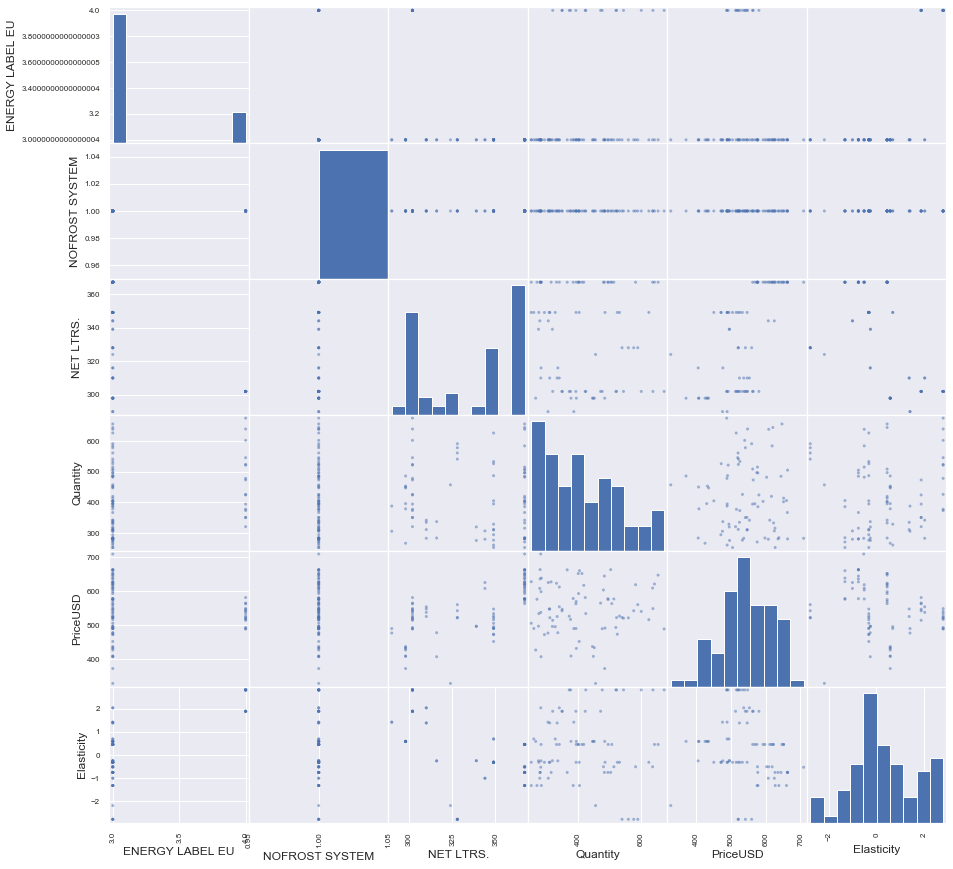

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count        97.000000       97.000000   97.00000   97.000000   97.000000   
mean          3.628866        0.731959  330.71134  303.630145  494.468662   
std           0.485618        0.445240   37.28353  114.462218  126.985069   
min           3.000000        0.000000  240.00000   15.000000  219.267059   
25%           3.000000        0.000000  302.00000  228.000000  373.983799   
50%           4.000000        1.000000  344.00000  299.000000  536.940902   
75%           4.000000        1.000000  366.00000  372.900000  588.290041   
max           4.000000        1.000000  369.00000  592.000000  673.663951   

       Elasticity  
count   97.000000  
mean    -2.145253  
std      1.361591  
min     -5.370740  
25%     -2.384390  
50%     -1.906452  
75%     -1.165968  
max      0.055779  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000        0.

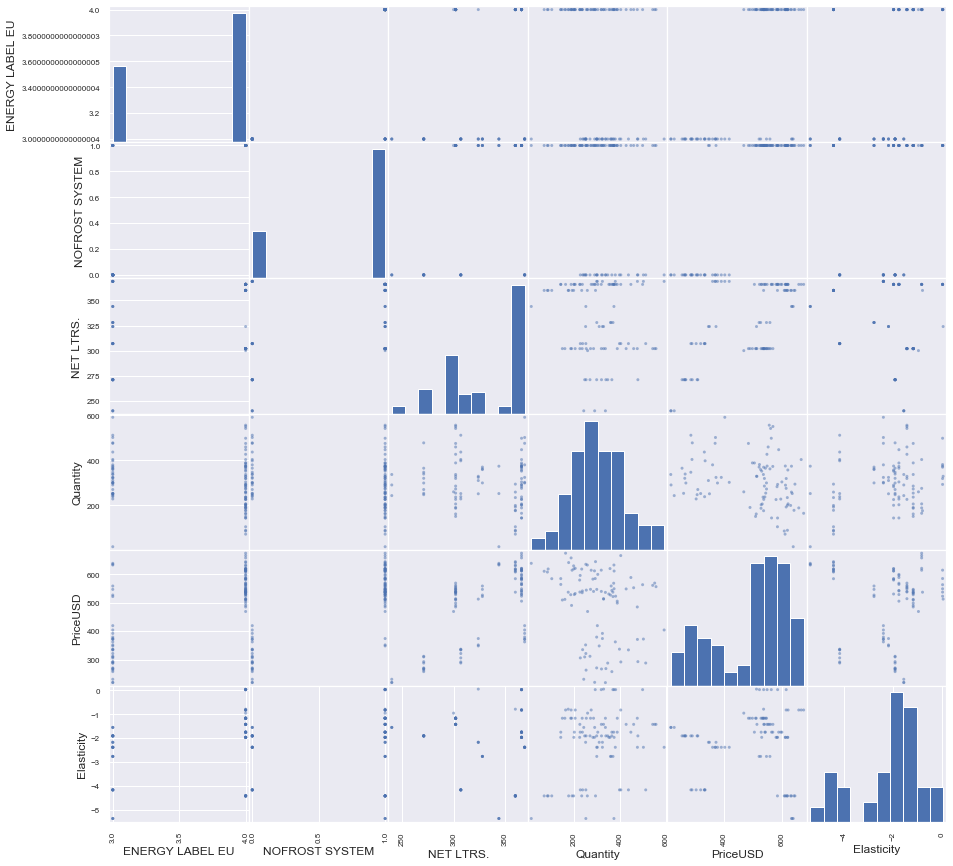

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1561.000000          1561.0  1561.000000  1561.000000  1561.000000   
mean          2.956438             1.0   319.255605    20.943857   502.107017   
std           0.204183             0.0    35.915544    35.676440   128.492047   
min           2.000000             1.0   224.000000    -1.000000   116.905072   
25%           3.000000             1.0   303.000000     4.000000   423.765979   
50%           3.000000             1.0   321.000000     8.000000   469.529382   
75%           3.000000             1.0   339.000000    21.000000   553.255742   
max           3.000000             1.0   455.000000   262.000000  1150.639897   

        Elasticity  
count  1561.000000  
mean     -0.026320  
std       0.288016  
min      -2.767178  
25%      -0.060761  
50%      -0.001524  
75%       0.069517  
max       0.691027  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity 

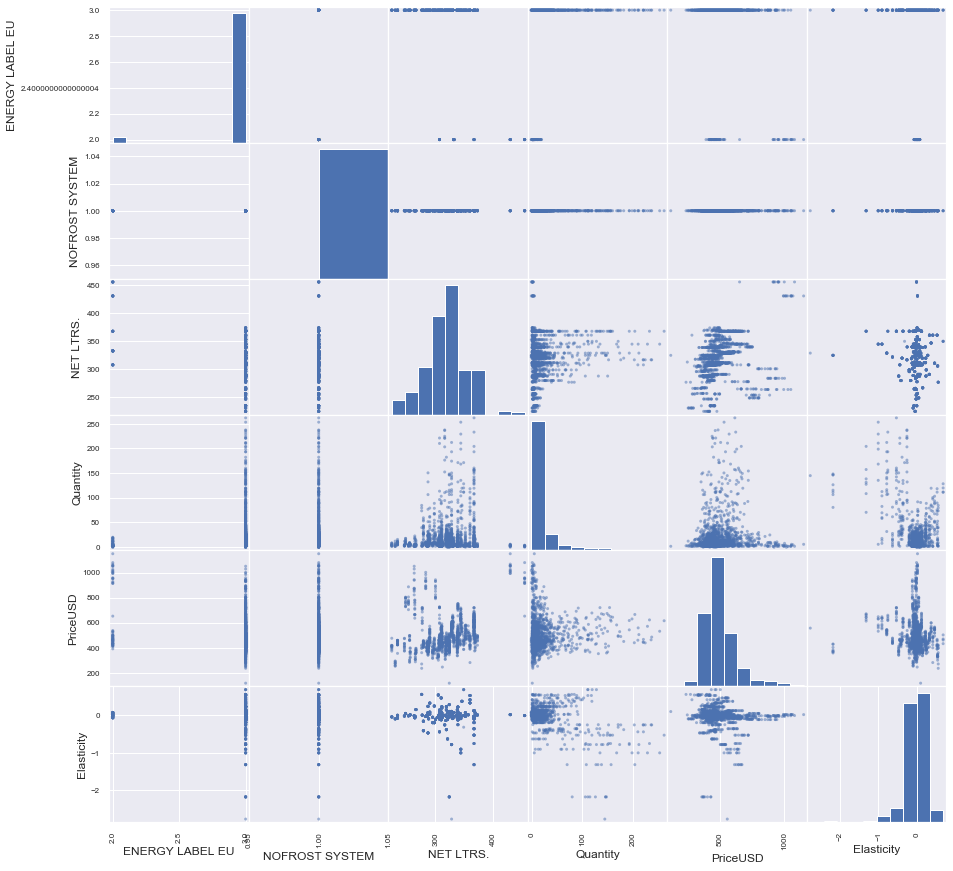

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       255.000000      255.000000  255.000000  255.000000   255.000000   
mean          4.262745        0.800000  325.274510    5.123974  1205.917891   
std           0.440991        0.400787   46.452871    5.315895   263.307138   
min           4.000000        0.000000  237.000000    1.000000   726.613059   
25%           4.000000        1.000000  301.000000    2.000000   982.586855   
50%           4.000000        1.000000  335.000000    3.600000  1157.910549   
75%           5.000000        1.000000  360.000000    6.000000  1414.506748   
max           5.000000        1.000000  402.000000   39.000000  1971.058245   

       Elasticity  
count  255.000000  
mean    -0.006689  
std      0.020967  
min     -0.060931  
25%     -0.014859  
50%     -0.001724  
75%      0.004647  
max      0.041490  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

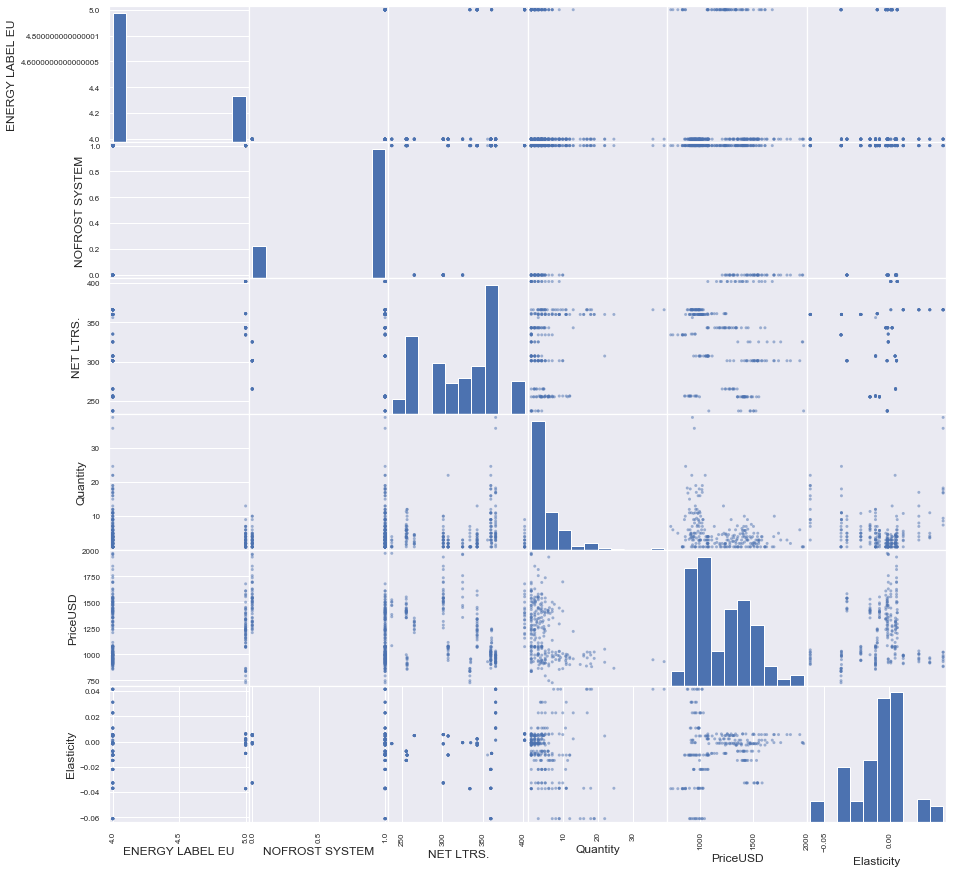

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count            330.0           330.0  330.000000  330.000000   330.000000   
mean               4.0             0.0  321.978788   12.611657   504.684110   
std                0.0             0.0   39.203655   16.015817   191.215550   
min                4.0             0.0  231.000000   -1.000000   239.013902   
25%                4.0             0.0  301.000000    3.000000   358.051345   
50%                4.0             0.0  337.000000    6.000000   450.210862   
75%                4.0             0.0  346.000000   15.000000   586.331044   
max                4.0             0.0  392.000000  110.500000  1221.635657   

       Elasticity  
count  330.000000  
mean     0.021934  
std      0.154728  
min     -0.238619  
25%     -0.025225  
50%     -0.002624  
75%      0.018103  
max      0.706790  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 4.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:95: RuntimeWarning: invalid value encountered in true_divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


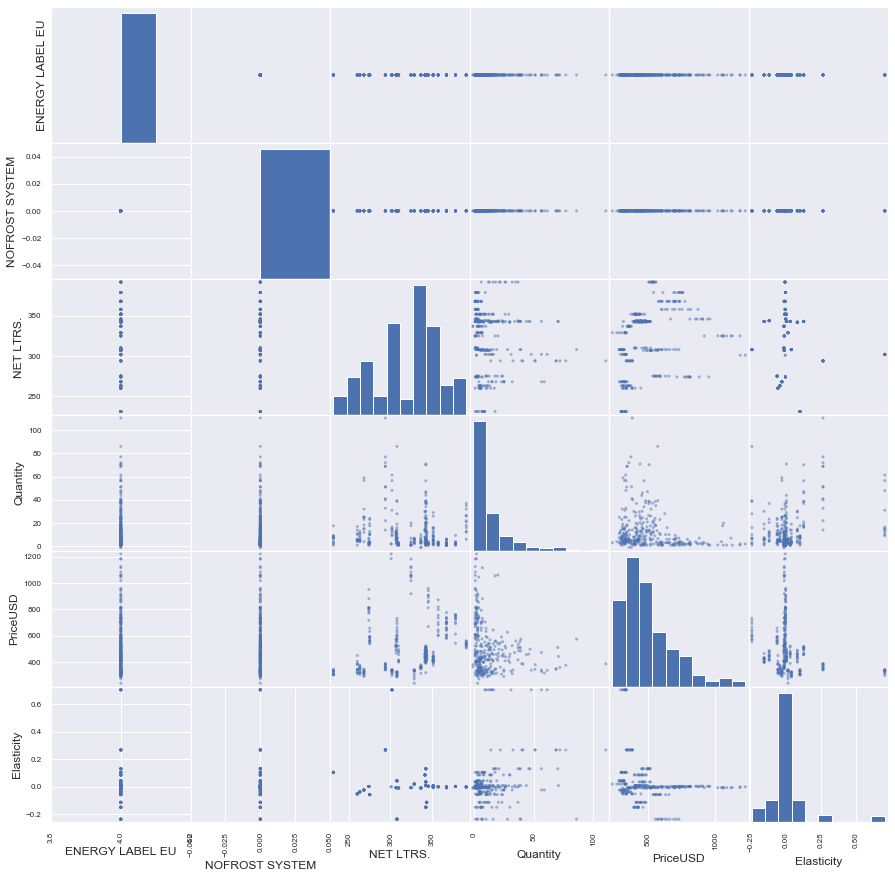

Кластер 16
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       978.000000           978.0  978.000000  978.000000  978.000000   
mean          3.931493             1.0  329.706544   39.201263  576.900714   
std           0.252743             0.0   31.786983   50.765169  109.666173   
min           3.000000             1.0  237.000000   -1.000000  326.271099   
25%           4.000000             1.0  304.000000    6.000000  488.492085   
50%           4.000000             1.0  338.000000   19.000000  571.974342   
75%           4.000000             1.0  360.000000   52.300000  650.234439   
max           4.000000             1.0  367.000000  301.000000  893.999618   

       Elasticity  
count  978.000000  
mean     0.198263  
std      0.660839  
min     -1.967937  
25%     -0.048011  
50%      0.024942  
75%      0.198748  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

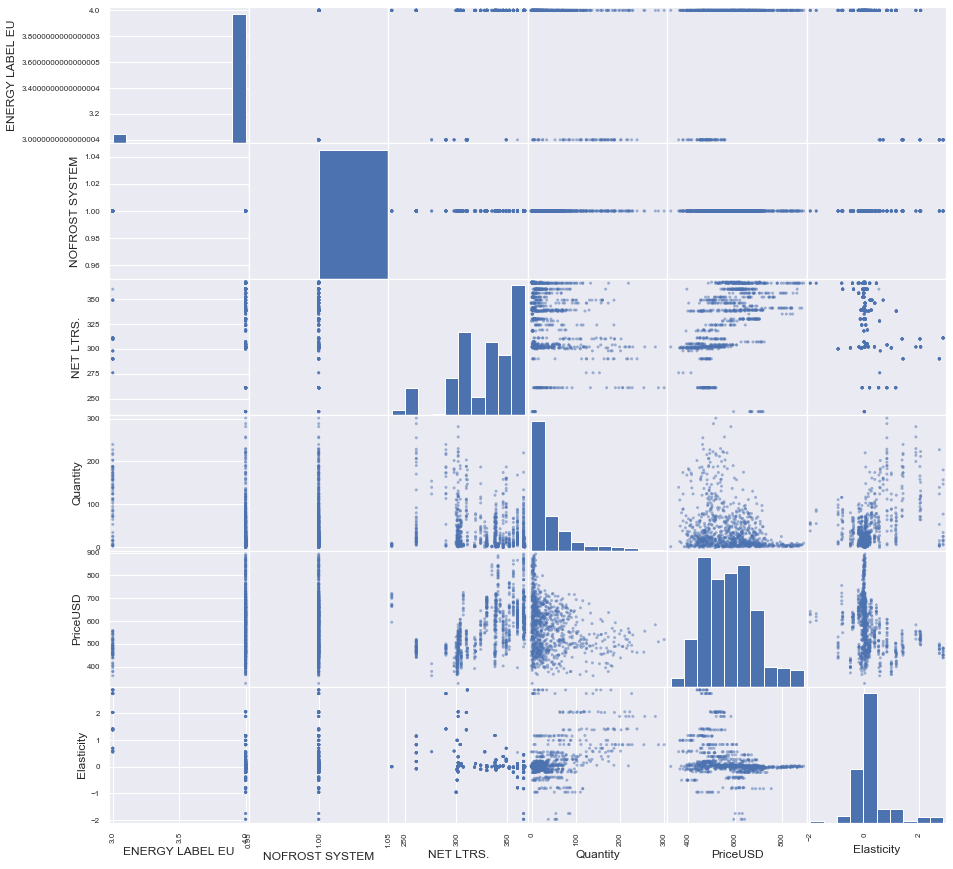

In [41]:
for i in np.unique(clusters):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [42]:
data_dist = pdist(dataNorm, 'braycurtis') # побудова матриці відстаней

In [43]:
data_linkage = linkage(data_dist, method='ward') # об'єднання елементів у кластери

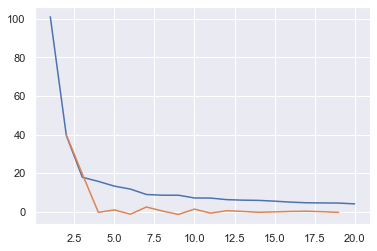

clusters: 2


In [44]:
lokot(data_linkage)

In [45]:
clustering_criterion_ierarhi(dataNorm, 'ward', 'braycurtis')

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.6228637934549187
calinski harabasz score: 3011.670994175157
davies_bouldin_score: 1.229623962781454
Clusters: 3
silhouette_score: 0.5627136944747845
calinski harabasz score: 2197.846082159399
davies_bouldin_score: 1.4161048138674872
Clusters: 4
silhouette_score: 0.4662365199610387
calinski harabasz score: 1651.3734972075379
davies_bouldin_score: 1.2740342179754767
Clusters: 5
silhouette_score: 0.4765345162829426
calinski harabasz score: 1571.825610654052
davies_bouldin_score: 1.3034793732678414
Clusters: 6
silhouette_score: 0.39443196950957127
calinski harabasz score: 1503.2802808017748
davies_bouldin_score: 1.491068712670777
Clusters: 7
silhouette_score: 0.3971894233074958
calinski harabasz score: 1594.0172415187958
davies_bouldin_score: 1.249107300102165
Clusters: 8
silhouette_score: 0.40980056894446315
calinski harabasz score: 1522.7065036925728
davies_bouldin_score: 1.2030808133893978
Clusters: 9
silhouette_score: 0.40719525959878

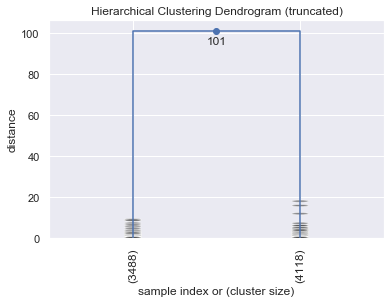

In [46]:
nCluster=2# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [47]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

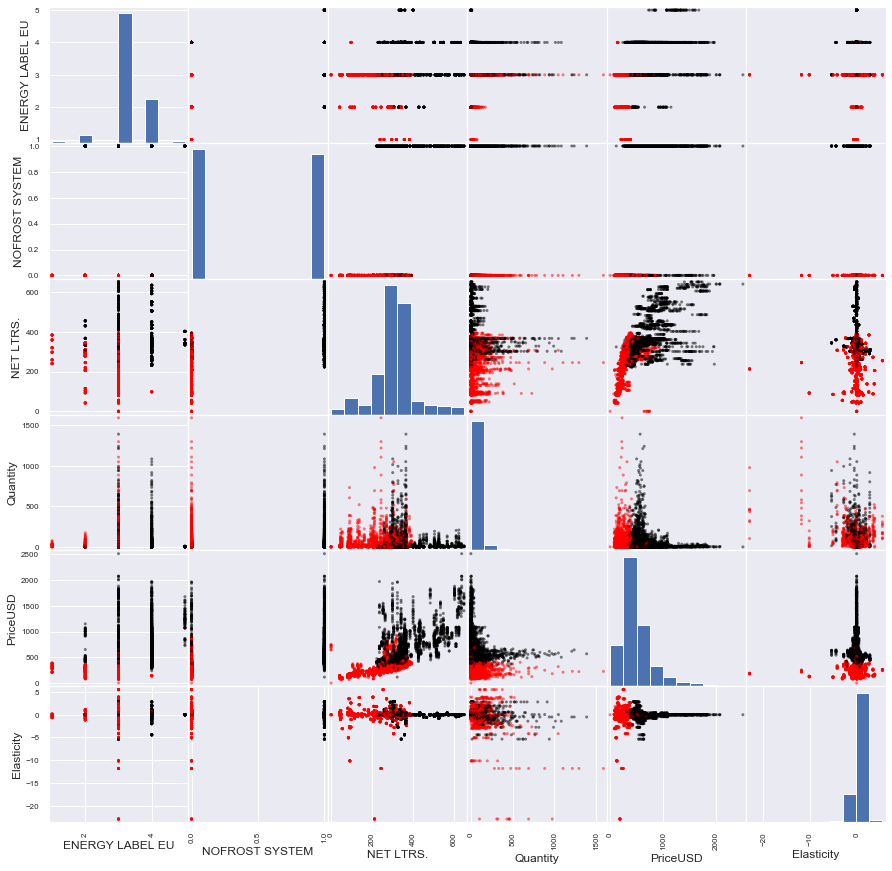

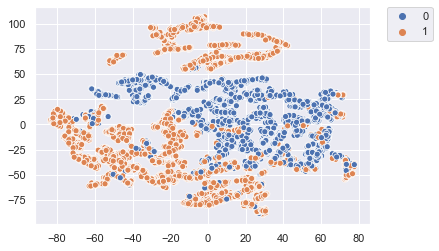

In [48]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [49]:
data['cluster_ier_wb_2']=clusters

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3488.000000          3488.0  3488.000000  3488.000000  3488.000000   
mean          2.896789             0.0   257.561353    45.850789   295.716253   
std           0.372115             0.0    86.219318    91.641559   117.081106   
min           1.000000             0.0     0.000000    -3.000000     0.000000   
25%           3.000000             0.0   212.000000     5.000000   221.333983   
50%           3.000000             0.0   279.000000    14.000000   293.027541   
75%           3.000000             0.0   321.000000    48.470000   348.496915   
max           4.000000             0.0   393.000000  1590.000000   930.692078   

        Elasticity  
count  3488.000000  
mean     -0.096453  
std       1.769244  
min     -22.929611  
25%      -0.152218  
50%       0.007911  
75%       0.174288  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


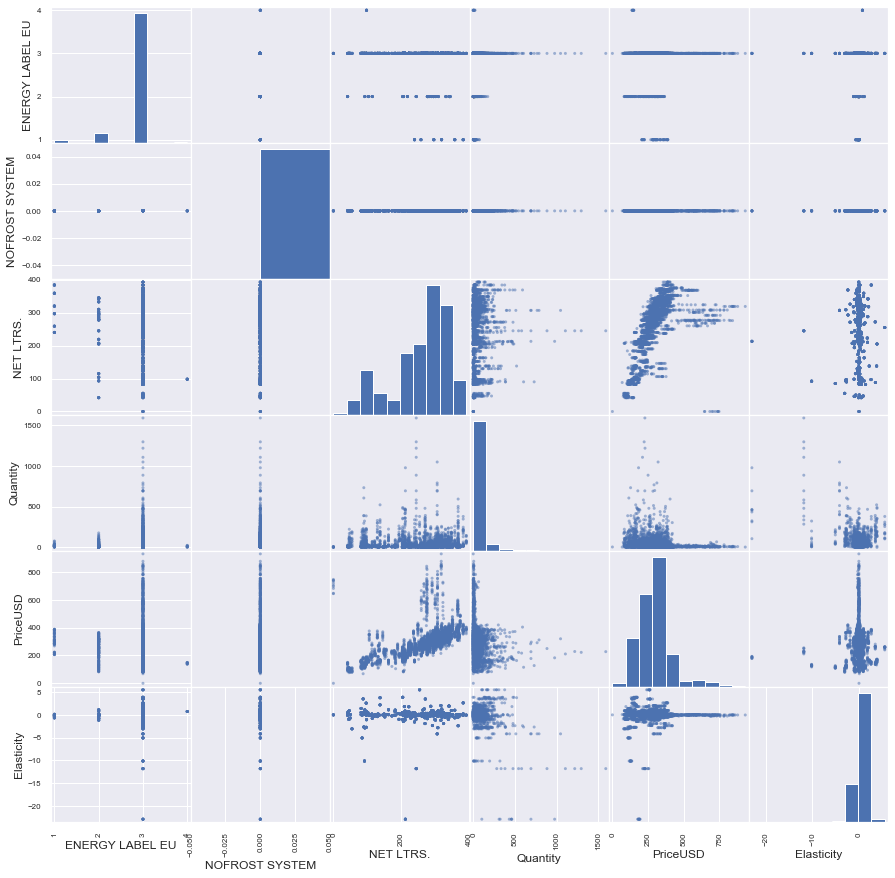

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      4118.000000     4118.000000  4118.000000  4118.000000  4118.000000   
mean          3.456532        0.907479   361.260563    42.291552   659.933120   
std           0.560136        0.289795    87.735838   105.157882   301.799504   
min           2.000000        0.000000   224.000000    -1.000000   116.905072   
25%           3.000000        1.000000   307.000000     4.000000   460.302881   
50%           3.000000        1.000000   339.000000     9.300000   563.783481   
75%           4.000000        1.000000   367.000000    30.000000   758.692695   
max           5.000000        1.000000   651.000000  1388.679739  2511.804930   

        Elasticity  
count  4118.000000  
mean     -0.013984  
std       0.603334  
min      -5.370740  
25%      -0.052266  
50%      -0.001531  
75%       0.046686  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

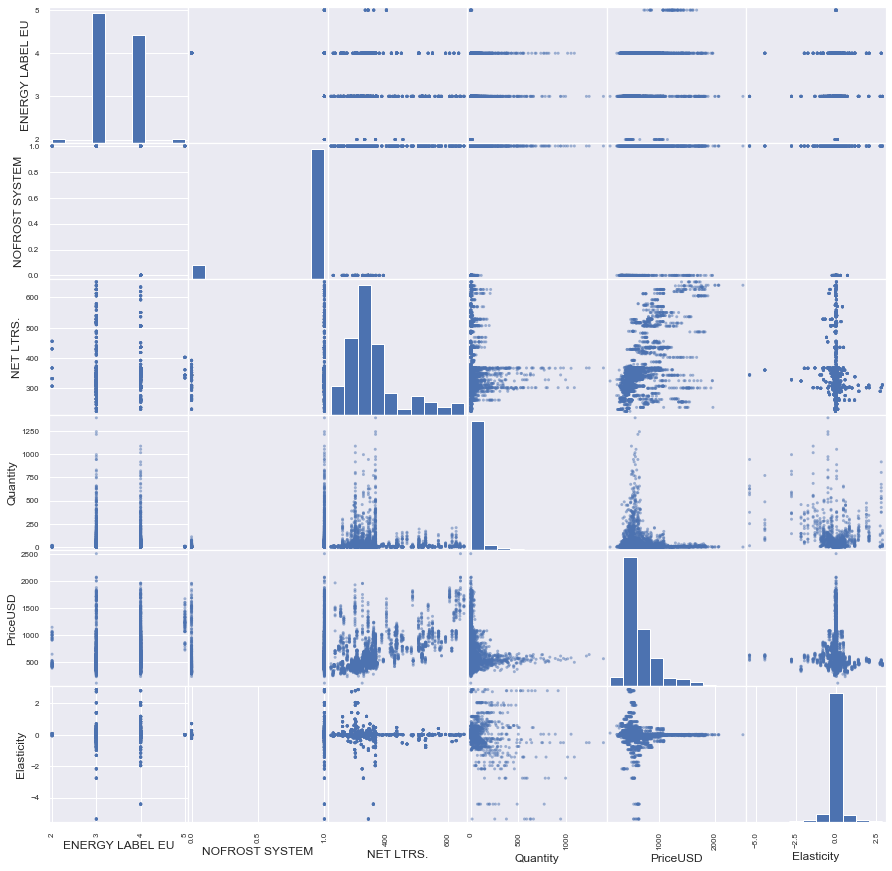

In [50]:
for i in np.unique(clusters):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Розглянемо те саме але для T-SNE# далі ще не готово

In [ ]:
data_dist = pdist(digits_proj, 'correlation') # побудова матриці відстаней

In [ ]:
data_linkage = linkage(data_dist, method='centroid') # об'єднання елементів у кластери

In [ ]:
lokot(data_linkage)

In [ ]:
nCluster=3# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [ ]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

In [ ]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)